# Quick loop on twin color pairs  with multi colors Z-Y And Simulate Atm effect

- author Sylvie Dagoret-Campagne
- creation date 2024-09-04
- affiliation : IJCLab
- Kernel @usdf **w_2024_16**
- Office emac : mamba_py311
- Home emac : base (conda)
- laptop : conda_py310

** Run LoopTwinSource before this notebook**
Must do quick run


In addition this notebook does simulation. It needs:
- getObsAtmo
- rubinsimphot
  

In [1]:
import warnings
warnings.resetwarnings()
warnings.simplefilter('ignore')

In [2]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm,SymLogNorm
from matplotlib.patches import Circle,Annulus
from astropy.visualization import ZScaleInterval
props = dict(boxstyle='round', facecolor=None, alpha=0.1)
#props = dict(boxstyle='round')

import matplotlib.colors as colors
import matplotlib.cm as cmx

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from matplotlib.gridspec import GridSpec

from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,PercentileInterval,
                                   ImageNormalize,imshow_norm)
from astropy.visualization.stretch import SinhStretch, LinearStretch,AsinhStretch,LogStretch

from astropy.io import fits
from astropy.wcs import WCS
from astropy import units as u
from astropy import constants as c

from scipy import interpolate
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KDTree, BallTree

import pandas as pd
pd.set_option("display.max_columns", None)
pd.set_option('display.max_rows', 100)

import matplotlib.ticker                         # here's where the formatter is
import os
import re
import pandas as pd
import pickle
from collections import OrderedDict

plt.rcParams["figure.figsize"] = (4,3)
plt.rcParams["axes.labelsize"] = 'x-large'
plt.rcParams['axes.titlesize'] = 'x-large'
plt.rcParams['xtick.labelsize']= 'x-large'
plt.rcParams['ytick.labelsize']= 'x-large'

import scipy
from scipy.optimize import curve_fit

In [3]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,PercentileInterval,
                                   ImageNormalize,imshow_norm)
from astropy.visualization.stretch import SinhStretch, LinearStretch,AsinhStretch,LogStretch

from astropy.time import Time


### Import getObsAtmo

- to simulate atmosphere

In [4]:
from importlib.metadata import version
the_ver = version('getObsAtmo')
print(f"Version of getObsAtmo : {the_ver}")

Version of getObsAtmo : 0.1.2


In [5]:
from getObsAtmo import ObsAtmo
emul = ObsAtmo("AUXTEL")

AUXTEL site name validated as LSST observatory


In [6]:
WL = emul.GetWL()

### import Library that encapsulate calculations for Photometric correction

from my package RubinLSSTPhotometricCorrTuto

In [7]:
import sys
sys.path.append('../lib')
#import libAtmosphericFit

In [8]:
# This package encapsulate the calculation on calibration used in this nb
from libPhotometricCorrections_auxtel import *

LSST site name validated as LSST observatory


In [9]:
def set_photometric_parameters(exptime, nexp, readnoise=None):
    # readnoise = None will use the default (8.8 e/pixel). Readnoise should be in electrons/pixel.
    photParams = PhotometricParameters(exptime=exptime, nexp=nexp, readnoise=readnoise)
    return photParams

In [10]:
def scale_sed(ref_mag, ref_filter, sed):
    fluxNorm = sed.calc_flux_norm(ref_mag, lsst_std[ref_filter])
    sed.multiply_flux_norm(fluxNorm)
    return sed


### import library rubin_sim defining LSST parameters, namely for photometric calculations including access to Pickles templates

In [11]:
from rubinsimphot.phot_utils import Bandpass, Sed
from rubinsimphot.data import get_data_dir

#### basic test for libPhotometricCorrections_auxtel

In [12]:
am0 =1.20    # airmass
pwv0 = 3.0  # Precipitable water vapor vertical column depth in mm
oz0 = 300.  # Ozone vertical column depth in Dobson Unit (DU)
ncomp=1     # Number of aerosol components
tau0= 0.04 # Vertical Aerosol depth (VAOD) 
beta0 = 1.2 # Aerosol Angstrom exponent

In [13]:
pc = PhotometricCorrections(am0,pwv0,oz0,tau0,beta0)

## Start here

In [14]:
# reference flux in Jy
F0 = ((0.*u.ABmag).to(u.Jy)).value
F0

3630.7805477010033

### Various checks

Text(0.5, 1.0, 'Standard atmosphere transmission')

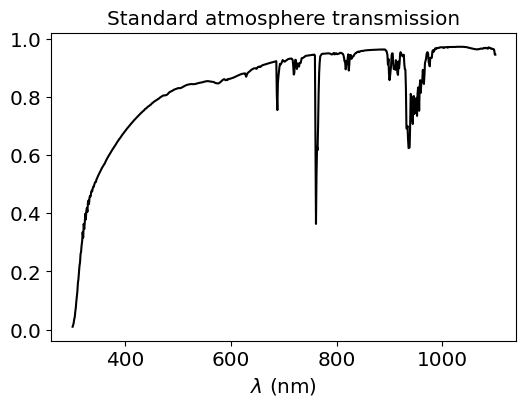

In [15]:
fig, axs = plt.subplots(1,1,figsize=(6,4))
axs.plot(pc.WL,pc.atm_std,'k-')
axs.set_xlabel("$\\lambda$ (nm)")
axs.set_title("Standard atmosphere transmission")


Text(0.5, 1.0, 'Instrument throughput (auxtel)')

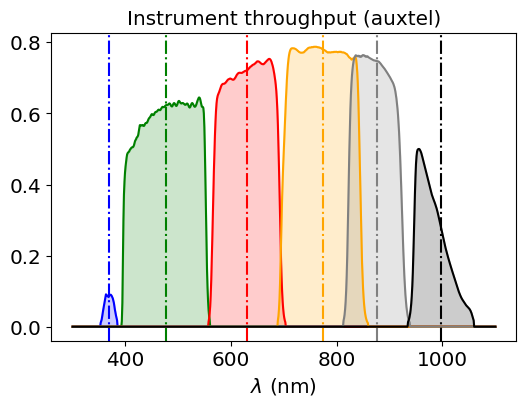

In [16]:
fig, axs = plt.subplots(1,1,figsize=(6,4))
# loop on filter
for index,f in enumerate(filter_tagnames):
    
    axs.plot(pc.bandpass_inst[f].wavelen,pc.bandpass_inst[f].sb,color=filter_color[index]) 
    axs.fill_between(pc.bandpass_inst[f].wavelen,pc.bandpass_inst[f].sb,color=filter_color[index],alpha=0.2) 
    axs.axvline(FILTERWL[index,2],color=filter_color[index],linestyle="-.")
    
axs.set_xlabel("$\\lambda$ (nm)")
axs.set_title("Instrument throughput (auxtel)")

#### Check SED Pickles

In [17]:
# Find the throughputs directory 
#fdir = os.getenv('RUBIN_SIM_DATA_DIR')
fdir = get_data_dir()
if fdir is None:  #environment variable not set
    fdir = os.path.join(os.getenv('HOME'), 'rubin_sim_data')

In [18]:
seddir = os.path.join(fdir, 'pysynphot', 'pickles')
seddir_uvk = os.path.join(seddir,"dat_uvk")
all_pickles_uvk = sorted(os.listdir(seddir_uvk))
file_ref = os.path.join(seddir_uvk, "pickles_uk.fits")
hdul = fits.open(file_ref)
df_pickle = pd.DataFrame(hdul[1].data)
print(df_pickle.head())
NSED = len(df_pickle)

                                   FILENAME        SPTYPE
0  pickles_uk_1                              O5V         
1  pickles_uk_2                              O9V         
2  pickles_uk_3                              B0V         
3  pickles_uk_4                              B1V         
4  pickles_uk_5                              B3V         


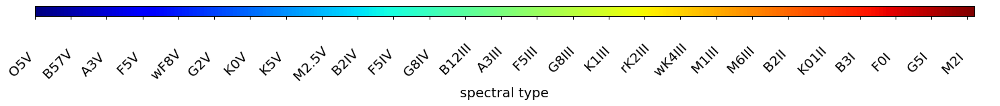

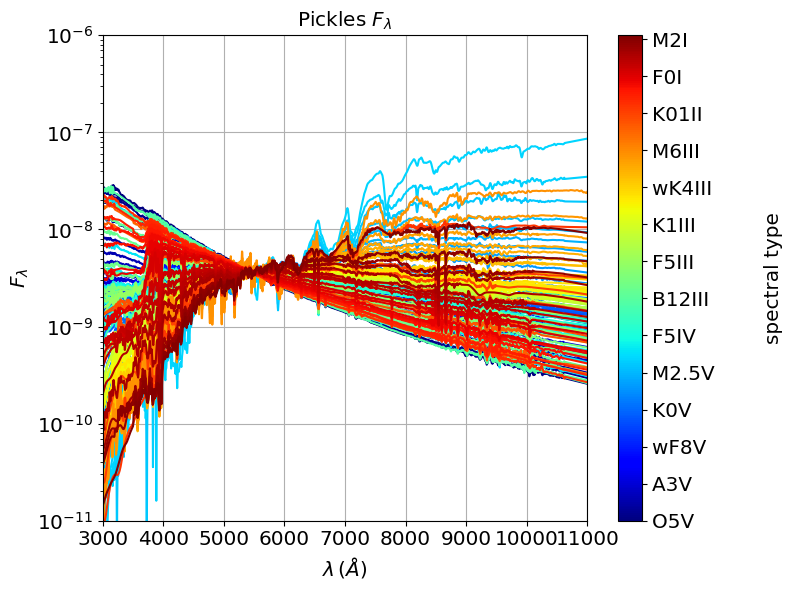

In [19]:
# wavelength bin colors
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=0, vmax=NSED)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(np.arange(NSED), alpha=1)

fig, ax = plt.subplots(figsize=(18, 0.2), layout='constrained')
cmap = mpl.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=NSED)
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),cax=ax, orientation='horizontal', label='spectral type')

# change the number of labels
labels = [item.get_text() for item in cbar.ax.get_xticklabels()]
cbar.ax.locator_params(axis='x', nbins=4*len(labels)) 
labels = [item.get_text() for item in cbar.ax.get_xticklabels()]

# rename the labels
Nlabels = len(labels)
for ilab in range(0,Nlabels-1):
    the_label = int(labels[ilab])
    labels[ilab] = df_pickle.loc[the_label,"SPTYPE"]
cbar.ax.set_xticklabels(labels,rotation=45);
plt.show()


fig,ax = plt.subplots(1,1,figsize=(8,6))
for index in np.arange(NSED):
    filename = df_pickle.loc[index,"FILENAME"].strip()+".fits"
    fullfilename = os.path.join(seddir_uvk,filename) 
    hdul = fits.open(fullfilename)
    dff = pd.DataFrame(hdul[1].data)
    if index < 100 or index > 104: 
        ax.plot(dff.WAVELENGTH,dff.FLUX,color=all_colors[index])
ax.set_yscale('log')
ax.set_xlim(3000.,11000)
ax.set_ylim(1e-11,1e-6)
ax.grid()
ax.set_title("Pickles $F_\lambda$")
ax.set_ylabel("$F_\lambda$")
ax.set_xlabel("$\lambda \, (\AA$)")
#plt.colorbar(ax.collections[0],ax=ax,orientation = 'horizontal',shrink=0.8)
#ax.collections[-1].colorbar

cbar =fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),ax=ax, orientation='vertical', label='spectral type')

#cbar = plt.colorbar(ax.collections[0],ax=ax)
#cbar.ax.set_ylabel('spectral type', rotation=90)

labels = [item.get_text() for item in cbar.ax.get_yticklabels()]
cbar.ax.locator_params(axis='y', nbins=2*len(labels)) 
labels = [item.get_text() for item in cbar.ax.get_yticklabels()]

Nlabels = len(labels)
for ilab in range(0,Nlabels-1):
    the_label = int(labels[ilab])
    labels[ilab] = df_pickle.loc[the_label,"SPTYPE"]
cbar.ax.set_yticklabels(labels,rotation=0);
plt.tight_layout()


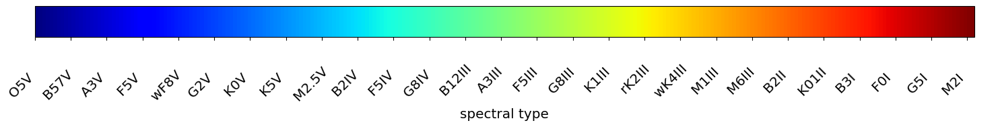

In [20]:
fig, ax = plt.subplots(figsize=(18, 0.6), layout='constrained')
cmap = mpl.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=NSED)
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),cax=ax, orientation='horizontal', label='spectral type')

# change the number of labels
labels = [item.get_text() for item in cbar.ax.get_xticklabels()]
cbar.ax.locator_params(axis='x', nbins=4*len(labels)) 
labels = [item.get_text() for item in cbar.ax.get_xticklabels()]

# rename the labels
Nlabels = len(labels)
for ilab in range(0,Nlabels-1):
    the_label = int(labels[ilab])
    labels[ilab] = df_pickle.loc[the_label,"SPTYPE"]
cbar.ax.set_xticklabels(labels,rotation=45);
plt.show()

In [21]:
transform = AsinhStretch() + PercentileInterval(99.)

In [22]:
# INSERT YOUR collection and tract
# for rehearsal use collection 2 which have CCDvisit
butlerRoot = "/repo/embargo"

collection1 = 'LSSTComCamSim/runs/nightlyvalidation/20240402/d_2024_03_29/DM-43612'
collection2 = 'LSSTComCamSim/runs/nightlyvalidation/20240403/d_2024_03_29/DM-43612'
collection3 = 'LSSTComCamSim/runs/nightlyvalidation/20240404/d_2024_03_29/DM-43612'
collection = 'LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20240414/w_2024_15/PREOPS-5069' # COMPLETED
collection = 'LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20240513/w_2024_20/PREOPS-5146' # test this one today 2024/06/22

collectionn = collection
#collections = [collection1,collection2,collection3]
collections = [collection]
collectionStr = collectionn.replace("/", "_")
fn_ccdVisit_tracts_patches = f"ccdVisittractpatch_{collectionStr}.csv"
instrument = 'LATISS'
skymapName = "latiss_v1"
where_clause = "instrument = \'" + instrument+ "\'"
tract = 3864 # mostly for light-curves
patch_sel = 236
#tract = 5615
# tract = 5634 # interesting to view calib parameters
suptitle = collectionStr + f" inst = {instrument} tract = {tract}"

In [23]:
# Max angular distance betwwen stars of the pair
sep_max = 200.
sep_time = 3600.

## Definition of functions used

In [24]:
def convert_fluxtomag(x) :
    """
    The object and source catalogs store only fluxes. There are hundreds of flux-related columns, 
    and to store them also as magnitudes would be redundant, and a waste of space.
    All flux units are nanojanskys. The AB Magnitudes Wikipedia page provides a concise resource 
    for users unfamiliar with AB magnitudes and jansky fluxes. To convert to AB magnitudes use:
    As demonstrated in Section 2.3.2, to add columns of magnitudes after retrieving columns of flux, users can do this:
    results_table['r_calibMag'] = -2.50 * numpy.log10(results_table['r_calibFlux']) + 31.4
    results_table['r_cModelMag'] = -2.50 * numpy.log10(results_table['r_cModelFlux']) + 31.4
    (from DP0 tutorial)
    """
    return -2.50 * np.log10(x) + 31.4

In [25]:
def closestvisit(df1,df2):
    """
    This function associate pairs of closest observation for photmetry

    input : the 2 dataframes (first to one for which one want to find the closest obs in dtaframe 2)
    output : the dataframe of similar format as the first one having columns on nightobs , visit time, dt from second dataframe)
    """
    d1 =df1.copy(deep=True)
    d2 =df2.copy(deep=True)
    all_samples = []
    df = pd.DataFrame(index=d1.index,columns=["nightObs2","visit2","time2","deltat"])
    for key in d1.index:

        nightObs = key[0]
        time1 = d1.loc[key]["time"]
        d2["dt"] = np.abs(d2["time"]-time1)
        d2["Dt"] = d2["time"]-time1
        cut_sel = (d2["dt"] == d2["dt"].min()) #& (d2["nightObs"] == nightObs)
        sample = d2[cut_sel]
        #df.iloc[key] = [sample.index[0][0],sample.index[0][1],sample["time"].values[0],sample['dt'].values[0]]
        df.loc[key]["nightObs2"] = sample.index[0][0]
        df.loc[key]["visit2"] = sample.index[0][1]
        df.loc[key]["time2"] = sample["time"].values[0]
        df.loc[key]["deltat"] = pd.to_timedelta(sample["Dt"].values[0], unit="s").total_seconds()
        all_samples.append(sample)

    # select observations during the same night
    df_back = df.copy(deep=True)
    flag_sel = []
    for key in df_back.index:
        nightObs = key[0]
        nightObs2 = df_back.loc[key]["nightObs2"]
        flag_sel.append(nightObs == nightObs2)
    df = df[flag_sel]
    return df

In [26]:
def getcutoutandimage(visitId,df_selectedvisits):
    """
    visitId : the calexp where are the two stars
    df_selectedvisits : the list of all sources and visit of the main targeted star
    """

    row_source = df_selectedvisits[df_selectedvisits.visit == visitId].iloc[0]  
    band = row_source['band']

    dataId = {'visit': visitId, 'instrument':instrument , 'detector': 0}
    calexp = butler.get('calexp', **dataId,collections=collections)   
    src_cat = butler.get('sourceTable',**dataId, collections=collections)

    #select on star
    #src_cat = src_cat[(src_cat["extendedness"]==0) & (src_cat["parentSourceId"] == 0) ]
    #src_cat = src_cat[src_cat["extendedness"]==0 ]

    x1 = row_source['x_x']
    y1 = row_source['y_x']
    ra1= row_source['ra_x']
    dec1= row_source['dec_x']
    psfMag1  = row_source['psfMag_x']  
    psfSigma1 = row_source['psfSigma_x']
    psfMagDiffMmag1 = row_source['psfMagDiffMmag_x'] 
    apFlux_50_0_instFlux1 = row_source['apFlux_50_0_instFlux_x']
    apFlux_50_0_instFluxErr1 = row_source['apFlux_50_0_instFluxErr_x']


    x2 = row_source['x_y']
    y2 = row_source['y_y']
    ra2= row_source['ra_y']
    dec2= row_source['dec_y']
    psfMag2  = row_source['psfMag_y']  
    psfSigma2 = row_source['psfSigma_y']
    psfMagDiffMmag2 = row_source['psfMagDiffMmag_y'] 
    apFlux_50_0_instFlux2 = row_source['apFlux_50_0_instFlux_y']
    apFlux_50_0_instFluxErr2 = row_source['apFlux_50_0_instFluxErr_y']

    
    # searcch the neighbouring stars
    #separation = find_neighbourg(ra_target,dec_target,src_cat)
    #src_cat["sep"] = separation


    spherePointCenter = lsst.geom.SpherePoint(ra1*lsst.geom.degrees, dec1*lsst.geom.degrees)
    spt = lsst.geom.SpherePoint(ra2*lsst.geom.degrees, dec2*lsst.geom.degrees)
    ang = spherePointCenter.separation(spt)
    ang_arcsec = ang.asArcseconds()
    
   
    x0 = (x1+x2)/2.
    y0 = (y1+y2)/2.
    ra0 = (ra1+ra2)/2.
    dec0 = (dec1+dec2)/2.
    

    dx1 = x1-x0
    dy1 = y1-y0
    dx2 = x2-x0
    dy2 = y2-y0
    
    
    boxSize = int(max(np.abs(x1-x2),np.abs(y1-y2)))
    xmin= x0-boxSize
    xmax= x0+boxSize
    ymin= y0-boxSize
    ymax= y0+boxSize
        
    
    minBbox = geom.Point2I(int(x0) - boxSize ,int(y0) - boxSize)
    maxBbox = geom.Point2I(int(x0) + boxSize, int(y0) + boxSize)
    
    srcBbox = geom.Box2I(minBbox, maxBbox)


    row_source['x0'] = x0
    row_source['y0'] = y0
    row_source['xmin'] = xmin
    row_source['ymin'] = ymin
    row_source['xmax'] = xmax
    row_source['ymax'] = ymax
    row_source['ra0'] = ra0
    row_source['dec0'] = dec0

    row_source['x1'] = x1
    row_source['y1'] = y1
    row_source['dx1'] = dx1
    row_source['dy1'] = dy1
    row_source['ra1'] = ra1
    row_source['dec1'] = dec1

    row_source['x2'] = x2
    row_source['y2'] = y2
    row_source['dx2'] = dx2
    row_source['dy2'] = dy2
    row_source['ra2'] = ra2
    row_source['dec2'] = dec2
    
    
    # Make the cutout
    try:
        subimg = afwImage.ExposureF(calexp, srcBbox, afwImage.PARENT, True)
        #subimg2 = calexp.getImage().array[int(ySrc) - boxSize: int(ySrc) + boxSize+1, int(xSrc) - boxSize:int(xSrc) + boxSize+1 ]
        #subimgRgb = afwRgb.makeRGB(subimg.image.array, None, None, expMin, expMax - expMin, Q)
        #all_cutout.append(subimgRgb)
        cutout=subimg.image.array
        
    except Exception as inst:
        print(type(inst))    # the exception type
        print(inst.args)     # arguments stored in .args
        print(inst)     
        cutout = None

    df_pair = row_source.to_frame()
    return row_source,cutout



In [27]:
def GetFluxes2StarsTwoBands(band1,band2,dfb1_b2,df_selectedvisits_b1,df_selectedvisits_b2):
    """
    Extract color difference from two bright object sources.
    band1 : first band tag 
    band2 : second band tag
    dfb1_b2 : pandas dataframe associating visit in band 1 to visit in band 2
    df_selectedvisits_b1: sources for object 1 and 2 in band 1
    df_selectedvisits_b2: sources for object 1 and 2 in band 2
    May plot some calexp cutout for checking
    """
    df_col_b1b2 = pd.DataFrame(columns = ["band1","exposure1","time1","psfMag11","psfMag12",
                                          "psfMagErr11","psfMagErr12",
                                          "apMag11","apMag12","apMagErr11","apMagErr12",
                                          "band2","exposure2","time2","psfMag21","psfMag22",
                                          "psfMagErr21","psfMagErr22",
                                          "apMag21","apMag22","apMagErr21","apMagErr22",
                                          "dt","airmassb1","airmassb2",
                                          "x11","y11","x12","y12","x21","y21","x22","y22"])
    entrycount = 0
    for idx,key in enumerate(dfb1_b2.index):
        print(idx,key)
        visit1 = key[1]
        visit2 = dfb1_b2.loc[key]["visit_" + band2]
        time1 = dfb1_b2.loc[key]["time"]
        time2 = dfb1_b2.loc[key]["time_" + band2]
        dt = dfb1_b2.loc[key]["dtsec_" + band2]
        print(f"======================= night :: {key[0]} ==> ({band1},{band2}) = ({visit1},{visit2}) =============================" )
        #row_target = df_selectedvisits_b1[df_selectedvisits_b1.visit == visit1].iloc[0]
        #print(row_target)
        # the selected sources retrieved from the sources associated to that calexp
        try:
            row_pair_b1,cutoutb1 = getcutoutandimage(visit1,df_selectedvisits_b1) 
            row_pair_b2,cutoutb2 = getcutoutandimage(visit2,df_selectedvisits_b2) 

            airmassb1 = row_pair_b1["airmass_x"] 
            airmassb2 = row_pair_b2["airmass_y"] 

            # first indec band, second index star
            # Star 1 in band 1
            psfMag11 =  row_pair_b1["psfMag_x"]
            psfMagErr11 =  row_pair_b1["psfMagErr_x"]
            apMag11 =  -2.5*np.log10(row_pair_b1["apFlux_35_0_instFlux_x"])
            apMagErr11 =  2.5/np.log(10)*(row_pair_b1["apFlux_35_0_instFluxErr_x"]/row_pair_b1["apFlux_35_0_instFlux_x"])
            x11 = row_pair_b1["x_x"]
            y11 = row_pair_b1["y_x"]
            
            # Star 2 in band 1
            psfMag12 =  row_pair_b1["psfMag_y"]
            psfMagErr12 =  row_pair_b1["psfMagErr_y"]
            apMag12 =  -2.5*np.log10(row_pair_b1["apFlux_35_0_instFlux_y"])
            apMagErr12 =  2.5/np.log(10)*(row_pair_b1["apFlux_35_0_instFluxErr_x"]/row_pair_b1["apFlux_35_0_instFlux_y"])
            x12 = row_pair_b1["x_y"]
            y12 = row_pair_b1["y_y"]
            
            # Star 1 in band 2
            psfMag21 =  row_pair_b2["psfMag_x"]
            psfMagErr21 =  row_pair_b2["psfMagErr_x"]
            apMag21 =  -2.5*np.log10(row_pair_b2["apFlux_35_0_instFlux_x"])
            apMagErr21 =  2.5/np.log(10)*(row_pair_b2["apFlux_35_0_instFluxErr_x"]/row_pair_b2["apFlux_35_0_instFlux_x"])
            x21 = row_pair_b2["x_x"]
            y21 = row_pair_b2["y_x"]
            
            # Star 2 in band 2
            psfMag22 =  row_pair_b2["psfMag_y"]
            psfMagErr22 =  row_pair_b2["psfMagErr_y"]
            apMag22 =  -2.5*np.log10(row_pair_b2["apFlux_35_0_instFlux_y"])
            apMagErr22 =  2.5/np.log(10)*(row_pair_b2["apFlux_35_0_instFluxErr_x"]/row_pair_b2["apFlux_35_0_instFlux_y"])
            x22 = row_pair_b2["x_y"]
            y22 = row_pair_b2["y_y"]


            
            df_col_b1b2.loc[entrycount] = [band1,visit1,time1,psfMag11,psfMag12,psfMagErr11,psfMagErr12,apMag11,apMag12,apMagErr11,apMagErr12,
                                           band2,visit2,time2,psfMag21,psfMag22,psfMagErr21,psfMagErr22,apMag21,apMag22,apMagErr21,apMagErr22,dt,
                                           airmassb1,airmassb2,x11,y11,x12,y12,x21,y21,x22,y22]
            entrycount+=1

        
        except Exception as inst:
            #print(type(inst))    # the exception type
            #print(inst.args)     # arguments stored in .args
            print(inst)
            continue
      

        if idx%10 == 0:
            if cutoutb1 is not None and cutoutb2 is not None:
                NROWS = 1
                NCOLS = 2
                fig, (ax1,ax2) = plt.subplots(ncols=NCOLS,nrows=NROWS,figsize=(6*NCOLS,6*NROWS))
                plotcutout(row_pair_b1,cutoutb1,ax=ax1)
                plotcutout(row_pair_b2,cutoutb2,ax=ax2)
                plt.show()

    # band 1 : mag_star1-mag_star2 
    df_col_b1b2["deltapsfmag_s12b1"] = (df_col_b1b2["psfMag11"] - df_col_b1b2["psfMag12"])
    df_col_b1b2["deltapsfmagErr_s12b1"] = np.sqrt(df_col_b1b2["psfMagErr11"]**2 + df_col_b1b2["psfMagErr12"]**2)

    df_col_b1b2["deltaapmag_s12b1"] = (df_col_b1b2["apMag11"] - df_col_b1b2["apMag12"])
    df_col_b1b2["deltaapmagErr_s12b1"] = np.sqrt(df_col_b1b2["apMagErr11"]**2 + df_col_b1b2["apMagErr12"]**2)
    
    # band 2 : mag_star1-mag_star2 
    df_col_b1b2["deltapsfmag_s12b2"] = (df_col_b1b2["psfMag21"] - df_col_b1b2["psfMag22"])
    df_col_b1b2["deltapsfmagErr_s12b2"] = np.sqrt(df_col_b1b2["psfMagErr21"]**2 + df_col_b1b2["psfMagErr22"]**2)
    df_col_b1b2["deltaapmag_s12b2"] = (df_col_b1b2["apMag21"] - df_col_b1b2["apMag22"])
    df_col_b1b2["deltaapmagErr_s12b2"] = np.sqrt(df_col_b1b2["apMagErr21"]**2 + df_col_b1b2["apMagErr22"]**2)

    
    # Star 1 : mag_band1-mag_band2 
    df_col_b1b2["psfcol12_s1"] = (df_col_b1b2["psfMag11"] - df_col_b1b2["psfMag21"])
    df_col_b1b2["psfcol12Err_s1"] = np.sqrt(df_col_b1b2["psfMagErr11"]**2 + df_col_b1b2["psfMagErr21"]**2)
    df_col_b1b2["apcol12_s1"] = (df_col_b1b2["apMag11"] - df_col_b1b2["apMag21"])
    df_col_b1b2["apcol12Err_s1"] = np.sqrt(df_col_b1b2["apMagErr11"]**2 + df_col_b1b2["apMagErr21"]**2)

    
    # Star 2 : mag_band1-mag_band2 
    df_col_b1b2["psfcol12_s2"] = (df_col_b1b2["psfMag12"] - df_col_b1b2["psfMag22"])
    df_col_b1b2["psfcol12Err_s2"] = np.sqrt(df_col_b1b2["psfMagErr12"]**2 + df_col_b1b2["psfMagErr22"]**2)
    df_col_b1b2["apcol12_s2"] = (df_col_b1b2["apMag12"] - df_col_b1b2["apMag22"])
    df_col_b1b2["apcol12Err_s2"] = np.sqrt(df_col_b1b2["apMagErr12"]**2 + df_col_b1b2["apMagErr22"]**2)

    
    # relative color star1 - star2
    df_col_b1b2["psfcol12_s12"] = np.abs(df_col_b1b2["psfcol12_s1"] - df_col_b1b2["psfcol12_s2"])
    df_col_b1b2["psfcol12Err_s12"] = np.sqrt(df_col_b1b2["psfcol12Err_s1"]**2 + df_col_b1b2["psfcol12Err_s2"]**2)
    df_col_b1b2["apcol12_s12"] = np.abs(df_col_b1b2["apcol12_s1"] - df_col_b1b2["apcol12_s2"])
    df_col_b1b2["apcol12Err_s12"] = np.sqrt(df_col_b1b2["apcol12Err_s1"]**2 + df_col_b1b2["apcol12Err_s2"]**2)

     # Maximum magnitude in band b1 and band b2
    df_col_b1b2["psfmagmax_s12b1"] = np.fmax(df_col_b1b2["psfMag11"],df_col_b1b2["psfMag12"])
    df_col_b1b2["psfmagmax_s12b2"] = np.fmax(df_col_b1b2["psfMag21"],df_col_b1b2["psfMag22"])

    df_col_b1b2["apmagmax_s12b1"] = np.fmax(df_col_b1b2["apMag11"],df_col_b1b2["apMag12"])
    df_col_b1b2["apmagmax_s12b2"] = np.fmax(df_col_b1b2["apMag21"],df_col_b1b2["apMag22"])
    
    
    return df_col_b1b2


In [28]:
def GetFluxes2StarsTwoBandsNoCutout(band1,band2,dfb1_b2,df_selectedvisits_b1,df_selectedvisits_b2):
    """
    Extract color difference from two bright object sources.
    band1 : first band tag 
    band2 : second band tag
    dfb1_b2 : pandas dataframe associating visit in band 1 to visit in band 2
    df_selectedvisits_b1: sources for object 1 and 2 in band 1
    df_selectedvisits_b2: sources for object 1 and 2 in band 2
    NO NOT plot some calexp cutout contrary to above function
    """
    df_col_b1b2 = pd.DataFrame(columns = ["band1","exposure1","time1","psfMag11","psfMag12",
                                          "psfMagErr11","psfMagErr12",
                                          "apMag11","apMag12","apMagErr11","apMagErr12",
                                          "band2","exposure2","time2","psfMag21","psfMag22",
                                          "psfMagErr21","psfMagErr22",
                                          "apMag21","apMag22","apMagErr21","apMagErr22",
                                          "dt","airmassb1","airmassb2",
                                          "x11","y11","x12","y12","x21","y21","x22","y22"                                         
                                         ])
    
    entrycount = 0
    for idx,key in enumerate(dfb1_b2.index):
        print(idx,key)
        visit1 = key[1]
        visit2 = dfb1_b2.loc[key]["visit_" + band2]
        time1 = dfb1_b2.loc[key]["time"]
        time2 = dfb1_b2.loc[key]["time_" + band2]
        dt = dfb1_b2.loc[key]["dtsec_" + band2]
        print(f"======================= night :: {key[0]} ==> ({band1},{band2}) = ({visit1},{visit2}) =============================" )
        #row_target = df_selectedvisits_b1[df_selectedvisits_b1.visit == visit1].iloc[0]
        #print(row_target)
        # the selected sources retrieved from the sources associated to that calexp
        try:
            #row_pair_b1,cutoutb1 = getcutoutandimage(visit1,df_selectedvisits_b1) 
            #row_pair_b2,cutoutb2 = getcutoutandimage(visit2,df_selectedvisits_b2) 
            row_pair_b1  = df_selectedvisits_b1[df_selectedvisits_b1.visit == visit1].iloc[0]  
            row_pair_b2  = df_selectedvisits_b2[df_selectedvisits_b2.visit == visit2].iloc[0]  

            airmassb1 = row_pair_b1["airmass_x"] 
            airmassb2 = row_pair_b2["airmass_y"] 
            
            # first indec band, second index star
            # Star 1 in band 1
            psfMag11 =  row_pair_b1["psfMag_x"]
            psfMagErr11 =  row_pair_b1["psfMagErr_x"]    
            apMag11 =  -2.5*np.log10(row_pair_b1["apFlux_35_0_instFlux_x"])
            apMagErr11 =  2.5/np.log(10.)*(row_pair_b1["apFlux_35_0_instFluxErr_x"]/row_pair_b1["apFlux_35_0_instFlux_x"])
            x11 = row_pair_b1["x_x"]
            y11 = row_pair_b1["y_x"]
            
            # Star 2 in band 1
            psfMag12 =  row_pair_b1["psfMag_y"]
            psfMagErr12 =  row_pair_b1["psfMagErr_y"]
            apMag12 =  -2.5*np.log10(row_pair_b1["apFlux_35_0_instFlux_y"])
            apMagErr12 =  2.5/np.log(10.)*(row_pair_b1["apFlux_35_0_instFluxErr_x"]/row_pair_b1["apFlux_35_0_instFlux_y"])
            x12 = row_pair_b1["x_y"]
            y12 = row_pair_b1["y_y"]
            
            # Star 1 in band 2
            psfMag21 =  row_pair_b2["psfMag_x"]
            psfMagErr21 =  row_pair_b2["psfMagErr_x"]
            apMag21 =  -2.5*np.log10(row_pair_b2["apFlux_35_0_instFlux_x"])
            apMagErr21 =  2.5/np.log(10.)*(row_pair_b2["apFlux_35_0_instFluxErr_x"]/row_pair_b2["apFlux_35_0_instFlux_x"])
            x21 = row_pair_b2["x_x"]
            y21 = row_pair_b2["y_x"]

            
            # Star 2 in band 2
            psfMag22 =  row_pair_b2["psfMag_y"]
            psfMagErr22 =  row_pair_b2["psfMagErr_y"]
            apMag22 =  -2.5*np.log10(row_pair_b2["apFlux_35_0_instFlux_y"])
            apMagErr22 =  2.5/np.log(10.)*(row_pair_b2["apFlux_35_0_instFluxErr_x"]/row_pair_b2["apFlux_35_0_instFlux_y"])
            x22 = row_pair_b2["x_y"]
            y22 = row_pair_b2["y_y"]


            
            df_col_b1b2.loc[entrycount] = [band1,visit1,time1,psfMag11,psfMag12,psfMagErr11,psfMagErr12,apMag11,apMag12,apMagErr11,apMagErr12,
                                           band2,visit2,time2,psfMag21,psfMag22,psfMagErr21,psfMagErr22,apMag21,apMag22,apMagErr21,apMagErr22,dt,airmassb1,airmassb2,
                                           x11,y11,x12,y12,x21,y21,x22,y22]

            entrycount+=1
        except Exception as inst:
            #print(type(inst))    # the exception type
            #print(inst.args)     # arguments stored in .args
            print(inst)
            continue

    # band 1 : mag_star1-mag_star2 
    df_col_b1b2["deltapsfmag_s12b1"] = (df_col_b1b2["psfMag11"] - df_col_b1b2["psfMag12"])
    df_col_b1b2["deltapsfmagErr_s12b1"] = np.sqrt(df_col_b1b2["psfMagErr11"]**2 + df_col_b1b2["psfMagErr12"]**2)

    df_col_b1b2["deltaapmag_s12b1"] = (df_col_b1b2["apMag11"] - df_col_b1b2["apMag12"])
    df_col_b1b2["deltaapmagErr_s12b1"] = np.sqrt(df_col_b1b2["apMagErr11"]**2 + df_col_b1b2["apMagErr12"]**2)
    
    # band 2 : mag_star1-mag_star2 
    df_col_b1b2["deltapsfmag_s12b2"] = (df_col_b1b2["psfMag21"] - df_col_b1b2["psfMag22"])
    df_col_b1b2["deltapsfmagErr_s12b2"] = np.sqrt(df_col_b1b2["psfMagErr21"]**2 + df_col_b1b2["psfMagErr22"]**2)
    df_col_b1b2["deltaapmag_s12b2"] = (df_col_b1b2["apMag21"] - df_col_b1b2["apMag22"])
    df_col_b1b2["deltaapmagErr_s12b2"] = np.sqrt(df_col_b1b2["apMagErr21"]**2 + df_col_b1b2["apMagErr22"]**2)

    
    # Star 1 : mag_band1-mag_band2 
    df_col_b1b2["psfcol12_s1"] = (df_col_b1b2["psfMag11"] - df_col_b1b2["psfMag21"])
    df_col_b1b2["psfcol12Err_s1"] = np.sqrt(df_col_b1b2["psfMagErr11"]**2 + df_col_b1b2["psfMagErr21"]**2)
    df_col_b1b2["apcol12_s1"] = (df_col_b1b2["apMag11"] - df_col_b1b2["apMag21"])
    df_col_b1b2["apcol12Err_s1"] = np.sqrt(df_col_b1b2["apMagErr11"]**2 + df_col_b1b2["apMagErr21"]**2)

    
    # Star 2 : mag_band1-mag_band2 
    df_col_b1b2["psfcol12_s2"] = (df_col_b1b2["psfMag12"] - df_col_b1b2["psfMag22"])
    df_col_b1b2["psfcol12Err_s2"] = np.sqrt(df_col_b1b2["psfMagErr12"]**2 + df_col_b1b2["psfMagErr22"]**2)
    df_col_b1b2["apcol12_s2"] = (df_col_b1b2["apMag12"] - df_col_b1b2["apMag22"])
    df_col_b1b2["apcol12Err_s2"] = np.sqrt(df_col_b1b2["apMagErr12"]**2 + df_col_b1b2["apMagErr22"]**2)

    
    # absolute relative color star1 - star2
    df_col_b1b2["psfcol12_s12"] = np.abs(df_col_b1b2["psfcol12_s1"] - df_col_b1b2["psfcol12_s2"])
    df_col_b1b2["psfcol12Err_s12"] = np.sqrt(df_col_b1b2["psfcol12Err_s1"]**2 + df_col_b1b2["psfcol12Err_s2"]**2)
    df_col_b1b2["apcol12_s12"] = np.abs(df_col_b1b2["apcol12_s1"] - df_col_b1b2["apcol12_s2"])
    df_col_b1b2["apcol12Err_s12"] = np.sqrt(df_col_b1b2["apcol12Err_s1"]**2 + df_col_b1b2["apcol12Err_s2"]**2)

    # Maximum magnitude in band b1 and band b2
    df_col_b1b2["psfmagmax_s12b1"] = np.fmax(df_col_b1b2["psfMag11"],df_col_b1b2["psfMag12"])
    df_col_b1b2["psfmagmax_s12b2"] = np.fmax(df_col_b1b2["psfMag21"],df_col_b1b2["psfMag22"])

    df_col_b1b2["apmagmax_s12b1"] = np.fmax(df_col_b1b2["apMag11"],df_col_b1b2["apMag12"])
    df_col_b1b2["apmagmax_s12b2"] = np.fmax(df_col_b1b2["apMag21"],df_col_b1b2["apMag22"])
    


    return df_col_b1b2

In [29]:
def closesttimespectrophotom(df_photpair,df_spec):
    """
    Search the closest spectroscopic time for a photometric light curve

    - calculate with assign
    df_spec[["Time"]].assign( ddt = lambda row : np.abs((row["Time"].loc[0].replace(tzinfo=None) - df_photpair["time1"].loc[1]).total_seconds()))
    - calculate with apply two quantities : dt_abs, dt_rel    
    df_spec[["dt_abs","td_rel"]]=df_spec[["Time"]].apply( lambda row : [ np.abs((row["Time"].replace(tzinfo=None) - df_photpair["time1"].loc[1]).total_seconds()),(row["Time"].replace(tzinfo=None) - df_photpair["time1"].loc[1]).total_seconds()],axis=1,result_type='expand')
    """
    d1 =df_photpair.copy(deep=True)
    d2 =df_spec.copy(deep=True)
    all_samples = []
    df = pd.DataFrame(index=d1.index,columns=["time1","time2","deltat"])
    
    # loop on light curve datapoints times
    all_spectro_associated = []
    for key in d1.index:
        # take the time of the first source 
        # remember dt must be small
        tphotometric = df_photpair["time1"].loc[key]
        df_spec_copy = df_spec.copy(deep=True)
        # compute relative and absolute time difference of spectro wrt photmetry
        df_spec_copy[["dt_abs_specphot","td_rel_specphot"]]=df_spec_copy[["Time"]].apply( lambda row : [ np.abs((row["Time"].replace(tzinfo=None) - tphotometric).total_seconds()),(row["Time"].replace(tzinfo=None) - tphotometric ).total_seconds()],axis=1,result_type='expand')
        # find the minimum on absolute time difference between spectro and photometry
        df_spec_sel = df_spec_copy[ df_spec_copy["dt_abs_specphot"] == df_spec_copy["dt_abs_specphot"].min()]
        all_spectro_associated.append(df_spec_sel)

    # merge all datapoint on single dataframe
    df_spec_sel_concat = pd.concat(all_spectro_associated)
    df_spec_sel_concat.reset_index(level=0, inplace=True)

    # set nan if more than 12*3600 seconds outside
    
    return df_spec_sel_concat


## Selected visits

### Spectroscopy

In [30]:
atmfilename = "data/spectro/auxtel_atmosphere_202301_v3.1.0_doSensorFlat_rebin2_testWithMaskedEdges_newBoundaries_newPolysRescaled_newFitBounds_adjustA1_lockedOrder2_removeThroughputTails_2.npy"

In [31]:
specdata = np.load(atmfilename,allow_pickle=True)

In [32]:
df_spec = pd.DataFrame(specdata)
df_spec

,DATE-OBS,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,D2CCD,LSHIFT,PARANGLE,TARGETX,TARGETY,LBDA_REF,PSF_REG,TRACE_R,MEANFWHM,PIXSHIFT,CHI2_FIT,A2_FIT,AM_FIT,VERSION,CCD_REBIN,CONFIG,EXPTIME,AIRMASS,DEC,HA,OUTTEMP,OUTPRESS,OUTHUM,FILTER,CAM_ROT,S_X0,S_Y0,S_XMIN,S_XMAX,S_YMIN,S_YMAX,S_NX,S_NY,S_DEG,S_SAT,S_ORDER,A1_x,A1_err_x,A2_x,A2_err_x,A3,A3_err,VAOD_x,VAOD_err_x,angstrom_exp_x,angstrom_exp_err_x,ozone [db]_x,ozone [db]_err_x,PWV [mm]_x,PWV [mm]_err_x,B_x,B_err_x,A_star,A_star_err,D_CCD [mm]_x,D_CCD [mm]_err_x,shift_x [pix],shift_x [pix]_err,shift_y [pix],shift_y [pix]_err,angle [deg],angle [deg]_err,x_c_0_1,x_c_0_1_err,x_c_1_1,x_c_1_1_err,x_c_2_1,x_c_2_1_err,y_c_0_1,y_c_0_1_err,y_c_1_1,y_c_1_1_err,y_c_2_1,y_c_2_1_err,gamma_0_1,gamma_0_1_err,gamma_1_1,gamma_1_1_err,gamma_2_1,gamma_2_1_err,alpha_0_1,alpha_0_1_err,alpha_1_1,alpha_1_1_err,alpha_2_1,alpha_2_1_err,saturation_0_1,saturation_0_1_err,x_c_0_2,x_c_0_2_err,x_c_1_2,x_c_1_2_err,x_c_2_2,x_c_2_2_err,y_c_0_2,y_c_0_2_err,y_c_1_2,y_c_1_2_err,y_c_2_2,y_c_2_2_err,gamma_0_2,gamma_0_2_err,gamma_1_2,gamma_1_2_err,gamma_2_2,gamma_2_2_err,alpha_0_2,alpha_0_2_err,alpha_1_2,alpha_1_2_err,alpha_2_2,alpha_2_2_err,saturation_0_2,saturation_0_2_err,x_c_0_3,x_c_0_3_err,x_c_1_3,x_c_1_3_err,x_c_2_3,x_c_2_3_err,y_c_0_3,y_c_0_3_err,y_c_1_3,y_c_1_3_err,y_c_2_3,y_c_2_3_err,gamma_0_3,gamma_0_3_err,gamma_1_3,gamma_1_3_err,gamma_2_3,gamma_2_3_err,alpha_0_3,alpha_0_3_err,alpha_1_3,alpha_1_3_err,alpha_2_3,alpha_2_3_err,saturation_0_3,saturation_0_3_err,A1_y,A1_err_y,A2_y,A2_err_y,VAOD_y,VAOD_err_y,angstrom_exp_y,angstrom_exp_err_y,ozone [db]_y,ozone [db]_err_y,PWV [mm]_y,PWV [mm]_err_y,reso [nm],reso [nm]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
0,2023-01-18 02:33:44.320492641+00:00,2023011700238,-64,2,1136,3,True,HD185975,-0.000065,holo4_003,0.149105,187.115733,0.0,139.709895,146.034375,882.149820,619.643455,14.563485,93.783944,10.355760,1.160026,10.840887,0.0,2.094160,3.1.0,2,,30.0,2.094160,-87.507430,-221.203268,10.00,743.00,NaN,empty,41.849028,-417.516831,19.149820,560,1696,863,908,1136,45,2,22666.666667,1,0.664441,0.005724,1.0,0.0,0.0,0.0,0.050687,0.004121,0.303824,0.028039,359.623063,1.770352,4.483119,0.020971,1.0,0.0,1.0,0.0,187.034266,0.008275,1.277989,0.041836,-0.193538,0.0,0.139924,0.0,986.182943,0.0,567.524178,0.0,-0.023856,0.0,-0.035756,0.000813,0.020469,0.001938,0.315324,0.004637,15.322203,0.015657,-4.534772,0.016222,-13.475017,0.036052,5.494988,0.008192,-0.822629,0.006912,-5.679592,0.016640,22666.666667,0.0,986.182943,0.0,567.524178,0.0,-0.023856,0.0,0.362173,0.177561,-2.036786,0.642700,-3.179989,0.568601,28.027856,0.970177,0.0,0.0,0.0,0.0,10.000000,0.602072,0.0,0.0,0.0,0.0,22666.666667,0.0,986.182943,0.0,567.524178,0.0,-0.023856,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.023469,0.0,0.0,0.0,0.0,0.0,8.988875,0.0,0.0,0.0,0.0,0.0,22666.666667,0.0,0.735193,0.701231,0.0,0.0,0.094037,0.459493,0.181265,0.997354,382.709734,9.364816,4.971505,0.064734,1.024480,0.027735,187.113505,0.004147,1.160026,0.0,0.0,0.0
1,2023-01-18 02:34:27.138506292+00:00,2023011700239,-64,2,1137,3,True,HD185975,-0.000065,holo4_003,0.138871,187.076469,0.0,139.885619,144.051156,882.564567,619.643455,0.228823,53.345136,10.918251,0.101144,4.849593,0.0,2.094525,3.1.0,2,,30.0,2.094525,-87.507439,-221.024162,10.00,743.00,NaN,empty,41.849066,-417.179307,19.564567,559,1696,863,908,1137,45,2,22666.666667,1,0.606995,0.000447,1.0,0.0,0.0,0.0,0.000000,0.000446,1.275747,0.000000,266.588883,1.690057,3.330756,0.018129,1.0,0.0,1.0,0.0,187.330383,0.004054,0.136300,0.009280,-0.058637,0.0,0.138740,0.0,985.285378,0.0,568.022658,0.0,-0.022383,0.0,-0.130373,0.000763,0.008003,0.002190,1.141302,0.004924,11.201134,0.010199,-0.512261,0.026190,3.048078,0.058986,3.454636,0.003848,0.508409,0.011071,1.073220,0.023461,22666.666667,0.0,985.285378,0.0,568.022658,0.0,-0.022383,0.0,-0.349097,0.155047,-5.994891,0.536350,-8.025680,0.457910,11.666854,0.096594,0.0,0.0,0.0,0.0,3.321643,0.034542,0.0,0.0,0.0

In [33]:
df_spec["Time"] = pd.to_datetime(df_spec["DATE-OBS"])
#df_spec["PWV [mm]_x"]

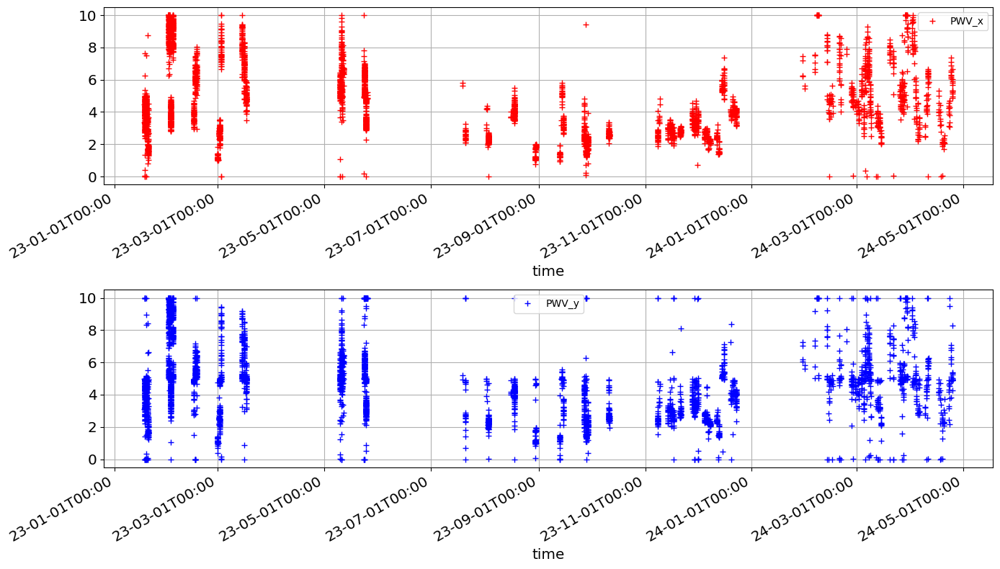

In [34]:
from matplotlib.dates import DateFormatter
date_form = DateFormatter("%y-%m-%dT%H:%M")
fig,axs = plt.subplots(2,1,figsize=(14,8))
ax1,ax2  = axs
df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="PWV_x")
df_spec.plot(x="Time",y="PWV [mm]_y",ax=ax2,marker='+',c="b",lw=0.0,grid=True,label="PWV_y")
ax1.set_xlabel("time")
ax1.xaxis.set_major_formatter(date_form)
ax2.set_xlabel("time")
ax2.xaxis.set_major_formatter(date_form)
plt.tight_layout()

## Photometry

#### read list of all possible pairs

In [35]:
df_pair = pd.read_csv("all_pairs.csv",index_col=0)
df_pair.head()

,objidx1,objidx2,G1_R1,G2_R2,Z1_Y1,Z2_Y2,sep
606,141.0,907.0,0.735042,0.980283,-0.114436,NaN,7.953708
2060,654.0,669.0,0.331201,0.533893,0.007770,-0.191827,10.576831
333,111.0,262.0,0.540740,0.144065,-0.112162,0.005726,16.129314
2152,813.0,950.0,0.864215,1.371627,-0.175939,NaN,16.859074
18,64.0,262.0,0.480447,0.144065,-0.094639,0.005726,18.288013


In [36]:
len(df_pair)

2211

Text(0.5, 1.0, 'Bright sources angular correlation in tract 3864')

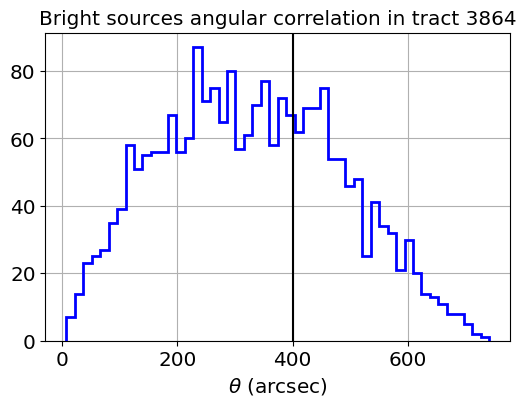

In [37]:
fig,axs = plt.subplots(1,1,figsize=(6,4))
ax1 = axs
df_pair["sep"].hist(bins=50,ax=ax1,histtype="step",color="b",lw=2);
image_size = 0.1*4000.
ax1.axvline(image_size,color="k")
ax1.set_xlabel("$\\theta$ (arcsec)")
ax1.set_title(f"Bright sources angular correlation in tract {tract}")


### Select the pairs

In [38]:
#sep_max = 100.
df_pair = df_pair[df_pair["sep"]<sep_max]

Text(0.5, 1.0, 'Bright sources angular correlation in tract 3864')

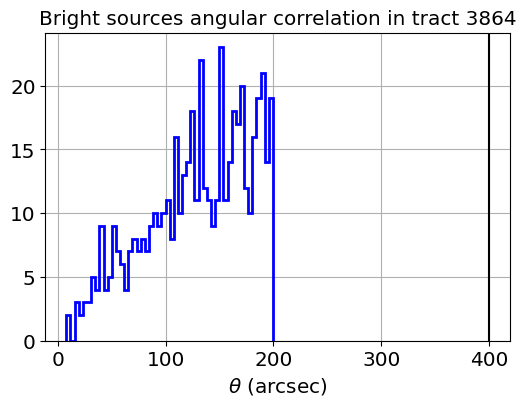

In [39]:
fig,axs = plt.subplots(1,1,figsize=(6,4))
ax1 = axs
df_pair["sep"].hist(bins=50,ax=ax1,histtype="step",color="b",lw=2);
image_size = 0.1*4000.
ax1.axvline(image_size,color="k")
ax1.set_xlabel("$\\theta$ (arcsec)")
ax1.set_title(f"Bright sources angular correlation in tract {tract}")

## Read pairs

In [40]:
#path_input = f"data_coloredlightcurvesZ_Y_thmax_{sep_max:.0f}"
path_input = f"data_coloredlightcurvesZ_Y_thmax_{sep_max:.0f}_tmax_{sep_time:.0f}"
if not os.path.exists(path_input):
    print(f"Missing directory {path_input}  ==> Must run notebook LoopTwinSourcesMultiColorLightCurveToFitsfromPairs-Auxtel-ColorZY.ipynb")
    assert False

### Read summary

- Note summary has been produced by **LookTwinSourcesMultiColorLightCurveToFitsfromPairs-Auxtel-ColorZY.ipynb**

In [41]:
#df_summary = pd.read_csv(os.path.join(path_input,f"photompairsummaryZ_Y_thmax_{sep_max:.0f}.csv"),index_col=0)
df_summary = pd.read_csv(os.path.join(path_input,f"photompairsummaryZ_Y_thmax_{sep_max:.0f}_tmax_{sep_time:.0f}.csv"),index_col=0)

In [42]:
df_summary

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax
0,0.0,141.0,907.0,7.0,0.089904,39.0,0.095301,39.0,0.095078,0.026872,39.0,14.677654
1,1.0,654.0,669.0,10.0,0.157383,25.0,0.157931,25.0,0.159177,0.021111,25.0,14.137261
2,2.0,111.0,262.0,16.0,0.094064,34.0,0.097442,34.0,0.100023,0.026601,34.0,14.934727
3,3.0,813.0,950.0,16.0,0.134367,27.0,0.139636,27.0,0.140848,0.034404,27.0,14.907334
4,4.0,64.0,262.0,18.0,0.073242,10.0,0.093076,10.0,0.099348,0.036333,10.0,14.993679
...,...,...,...,...,...,...,...,...,...,...,...,...
489,516.0,109.0,201.0,199.0,0.026078,46.0,0.027036,46.0,0.034685,0.026174,46.0,14.872735
490,517.0,272.0,433.0,199.0,0.088261,11.0,0.064407,11.0,0.063870,0.022416,11.0,14.492526
491,518.0,865.0,958.0,199.0,0.079293,9.0,0.125226,9.0,0.119368,0.020230,9.0,14.057159
492,519.0,123.0,470.0,199.0,0.125989,11.0,0.136270,11.0,0.137538,0.022049,11.0,14.013569


## Read all colors_diff

In [43]:
NPairs = int(df_summary["idx_pair"].max())

In [44]:
all_colors_diff = []
for idx in range(NPairs):
    num_str = str(idx).zfill(4)
    input_filename = f"color_lightcurveZ_Y_{num_str}_thmax_{sep_max:.0f}.csv"
    input_filename = f"color_lightcurveZ_Y_{num_str}_thmax_{sep_max:.0f}_tmax_{sep_time:.0f}.csv"
    input_fullfilename = os.path.join(path_input,input_filename)
    df_col = pd.read_csv(input_fullfilename,index_col=0)
    if len(df_col) > 0:
        # convert date string in datetime format for plotting date
        df_col["time1"] = df_col.apply( lambda row : pd.to_datetime(row["time1"]),axis=1,result_type="expand")
        df_col["time2"] = df_col.apply( lambda row : pd.to_datetime(row["time2"]),axis=1,result_type="expand")
        df_col["Time"] = df_col.apply( lambda row : pd.to_datetime(row["Time"]),axis=1,result_type="expand")
        df_col["DATE-OBS"] = df_col.apply( lambda row : pd.to_datetime(row["DATE-OBS"]),axis=1,result_type="expand")
       
    all_colors_diff.append(df_col)

In [45]:
Npairs = len(all_colors_diff)

In [46]:
props = dict(boxstyle='round', facecolor="white", alpha=1)
textstr = '\n'.join((
    r'$N_{pairs}=%.0f$' % (Npairs, ),
    r'$\theta_{sep}<%.0f$ arcsec' % (sep_max, )))

In [47]:
all_colors_diff[0][["time1","time2","dt","DATE-OBS","Time","dt_abs_specphot","td_rel_specphot"]] 

,time1,time2,dt,DATE-OBS,Time,dt_abs_specphot,td_rel_specphot
0,2023-11-28 06:48:13.984508928,2023-11-28 06:49:01.705502976,47.720994,NaT,NaT,NaN,NaN
1,2023-11-28 06:56:06.837505024,2023-11-28 06:56:55.432996096,48.595491,NaT,NaT,NaN,NaN
2,2023-11-30 07:17:14.174990080,2023-11-30 07:18:02.437506048,48.262515,NaT,NaT,NaN,NaN
3,2023-12-05 07:23:56.250501120,2023-12-05 07:24:44.167500032,47.916998,2023-12-05 07:54:48.307990779+00:00,2023-12-05 07:54:48.307990779+00:00,1852.057489,1852.057489
4,2023-12-06 06:49:56.236492032,2023-12-06 06:50:44.162500096,47.926008,NaT,NaT,NaN,NaN
5,2023-12-07 07:09:40.622003968,2023-12-07 07:10:28.394502912,47.772498,NaT,NaT,NaN,NaN
6,2023-12-07 07:17:17.739998976,2023-12-07 07:18:05.715494912,47.975495,NaT,NaT,NaN,NaN
7,2023-12-12 06:07:30.275010048,2023-12-12 06:08:18.640495104,48.365485,2023-12-12 05:15:13.704998371+00:00,2023-12-12 05:15:13.704998371+00:00,3136.570012,-3136.570012
8,2023-12-15 06:13:15.617505024,2023-12-15 06:14:01.042006016,45.424500,NaT,NaT,NaN,NaN
9,2023-12-15 06:36:07.239504896,2023-12-15 06:36:55.245509888,48.006004,NaT,NaT,NaN,NaN


### Check good/bad light curves

In [48]:
pd.options.display.max_rows = 300
df_summary["drefcol_psf_ap"] = df_summary["refcol_psf_md"] - df_summary["refcol_ap_md"]
df_summary

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap
0,0.0,141.0,907.0,7.0,0.089904,39.0,0.095301,39.0,0.095078,0.026872,39.0,14.677654,-0.005396
1,1.0,654.0,669.0,10.0,0.157383,25.0,0.157931,25.0,0.159177,0.021111,25.0,14.137261,-0.000548
2,2.0,111.0,262.0,16.0,0.094064,34.0,0.097442,34.0,0.100023,0.026601,34.0,14.934727,-0.003378
3,3.0,813.0,950.0,16.0,0.134367,27.0,0.139636,27.0,0.140848,0.034404,27.0,14.907334,-0.005269
4,4.0,64.0,262.0,18.0,0.073242,10.0,0.093076,10.0,0.099348,0.036333,10.0,14.993679,-0.019834
...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,516.0,109.0,201.0,199.0,0.026078,46.0,0.027036,46.0,0.034685,0.026174,46.0,14.872735,-0.000958
490,517.0,272.0,433.0,199.0,0.088261,11.0,0.064407,11.0,0.063870,0.022416,11.0,14.492526,0.023854
491,518.0,865.0,958.0,199.0,0.079293,9.0,0.125226,9.0,0.119368,0.020230,9.0,14.057159,-0.045933
492,519.0,123.0,470.0,199.0,0.125989,11.0,0.136270,11.0,0.137538,0.022049,11.0,14.013569,-0.010281


In [49]:
df_summary[df_summary.refcol_ap_md < 0.02]

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap
12,12.0,180.0,385.0,30.0,0.022868,4.0,0.015802,4.0,0.017878,0.009580,4.0,14.053274,0.007066
22,22.0,715.0,813.0,38.0,0.022376,3.0,0.013025,3.0,0.013319,0.001918,3.0,14.945976,0.009351
23,23.0,97.0,385.0,38.0,0.011183,10.0,0.012194,10.0,0.015723,0.012100,10.0,14.205465,-0.001010
25,25.0,610.0,950.0,40.0,0.017179,22.0,0.008708,22.0,0.013025,0.011298,22.0,14.153773,0.008472
28,28.0,526.0,545.0,41.0,0.013305,18.0,0.016972,18.0,0.024541,0.021510,18.0,14.827422,-0.003667
29,29.0,414.0,715.0,42.0,0.029851,10.0,0.009921,10.0,0.016545,0.016521,10.0,14.947766,0.019929
38,38.0,346.0,392.0,48.0,0.018652,33.0,0.016139,33.0,0.015738,0.009520,33.0,13.774577,0.002513
40,40.0,111.0,721.0,50.0,0.067078,1.0,0.005214,1.0,0.005214,0.000000,1.0,14.952840,0.061863
42,42.0,551.0,958.0,50.0,0.014987,19.0,0.014499,19.0,0.015200,0.010330,19.0,14.072364,0.000489
79,80.0,369.0,913.0,72.0,0.093388,3.0,0.012489,3.0,0.011174,0.002239,3.0,14.464970,0.080899


In [50]:
df_summary[df_summary.refcol_ap_md > 0.2]

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap
27,27.0,440.0,983.0,41.0,0.280381,9.0,0.269481,9.0,0.265915,0.017332,9.0,14.193083,0.010899
36,36.0,123.0,653.0,48.0,0.248857,32.0,0.253628,32.0,0.253206,0.013784,32.0,13.456232,-0.004771
54,55.0,392.0,527.0,57.0,0.221355,6.0,0.221317,6.0,0.216847,0.013594,6.0,13.790929,0.000038
55,56.0,97.0,175.0,58.0,0.200416,27.0,0.207555,27.0,0.209670,0.037212,27.0,14.915327,-0.007139
68,69.0,175.0,385.0,67.0,0.165200,1.0,0.205105,1.0,0.205105,0.000000,1.0,14.916865,-0.039905
74,75.0,433.0,983.0,70.0,0.237187,7.0,0.237895,7.0,0.245469,0.013758,7.0,14.496561,-0.000708
92,93.0,97.0,262.0,80.0,0.275624,88.0,0.279843,88.0,0.281531,0.019038,88.0,14.213496,-0.004219
109,111.0,657.0,983.0,87.0,0.281008,6.0,0.238486,6.0,0.241035,0.019102,6.0,14.624343,0.042521
119,121.0,558.0,610.0,92.0,0.263847,24.0,0.251677,24.0,0.247840,0.021907,24.0,14.151241,0.012169
122,124.0,308.0,619.0,94.0,0.322395,16.0,0.310195,16.0,0.312427,0.022795,16.0,14.540350,0.012200


### Plot all relative colors histograms

In [51]:
cmap = mpl.colormaps['jet']
colors_forplots = cmap(np.linspace(0, 1, Npairs))

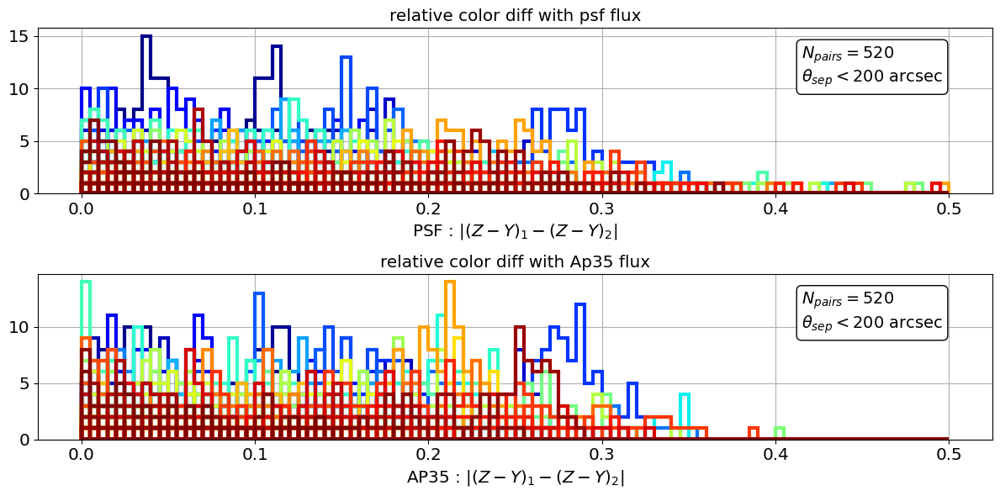

In [52]:
fig,(ax1,ax2) = plt.subplots(2,1,figsize=(12,6))
all_objectplotcolor = [] # compute median color per object
all_Ntimepoints = []
for idx,df in enumerate(all_colors_diff):
    df["psfcol12_s12"].hist(bins=100,range=(0,0.5),ax=ax1,histtype="step",color=colors_forplots[idx],lw=3)
ax1.set_title("relative color diff with psf flux")
ax1.text(0.8, 0.9, textstr, transform=ax1.transAxes, fontsize=14,verticalalignment='top', bbox=props)

for idx,df in enumerate(all_colors_diff):
    df["apcol12_s12"].hist(bins=100,range=(0,0.5),ax=ax2,histtype="step",color=colors_forplots[idx],lw=3)
    data =  df["apcol12_s12"].values
    if len(data)>=1:
        data= data[np.isfinite(data)]
        all_objectplotcolor.append(np.median(data))
        all_Ntimepoints.append(len(data))
    else:
        all_objectplotcolor.append(0.)
        
ax1.set_xlabel("PSF : $|(Z-Y)_1 - (Z-Y)_2|$")
ax2.set_xlabel("AP35 : $|(Z-Y)_1 - (Z-Y)_2|$")

ax2.set_title("relative color diff with Ap35 flux")
ax2.text(0.8, 0.9, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)
plt.tight_layout()

## Plots

In [53]:
# wavelength bin colors
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=0, vmax=0.35)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(all_objectplotcolor, alpha=1)


https://matplotlib.org/stable/users/explain/colors/colorbar_only.html

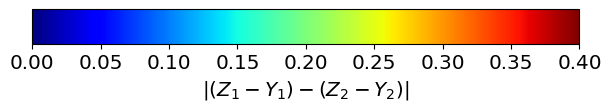

In [54]:
fig, ax = plt.subplots(figsize=(6, 1), layout='constrained')
cmap = mpl.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=0.4)
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),cax=ax, orientation='horizontal', label='$|(Z_1-Y_1)-(Z_2-Y_2)|$')


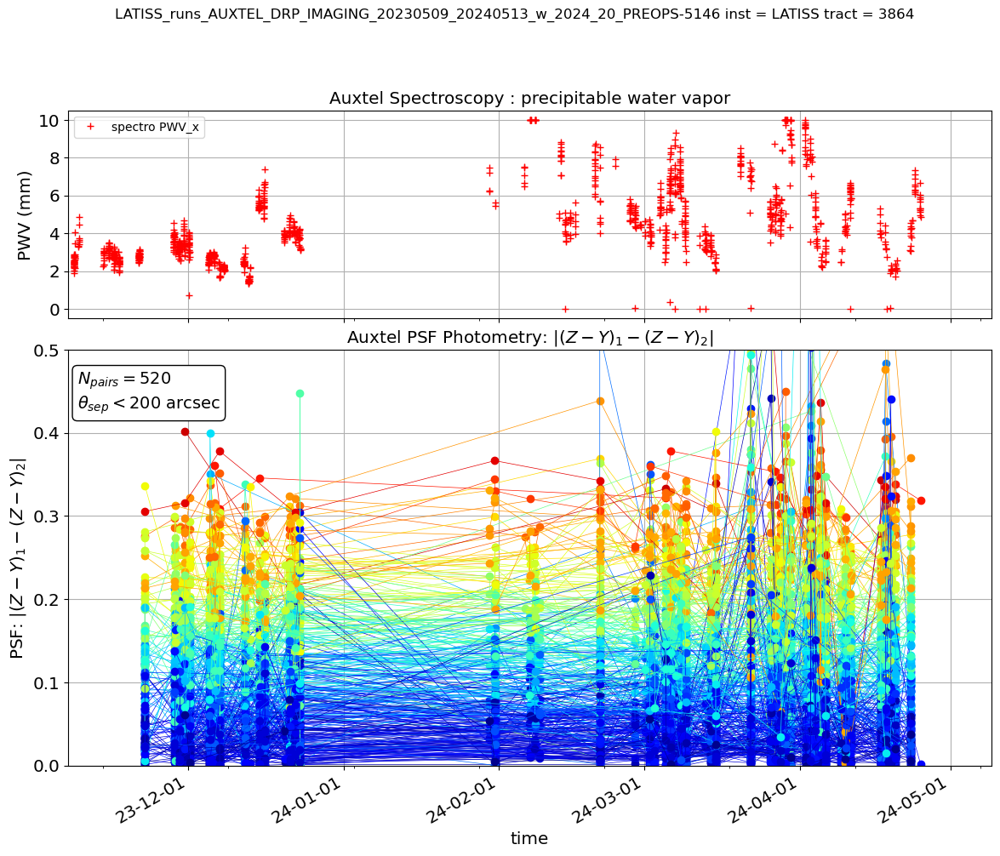

In [55]:
from matplotlib.dates import DateFormatter
#date_form = DateFormatter("%y-%m-%dT%H:%M")
date_form = DateFormatter("%y-%m-%d")
#fig,axs = plt.subplots(2,1,figsize=(14,8),sharex=True)

fig = plt.figure(figsize=(14,10),constrained_layout=True)
gs = GridSpec(2, 1, wspace=0, hspace=0.1, height_ratios=[1,2],figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1],sharex=ax1)


df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="spectro PWV_x")

all_tmin = []
all_tmax = []

for idx,df_col in enumerate(all_colors_diff):
    the_color = all_colors[idx]

    if(len(df_col)>5):

        #print(idx,df_col)
        df_col.plot(x="time1",y="psfcol12_s12",ax=ax2,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
        #ax2.errorbar(df_col.time1,df_col.psfcol12_s12,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")

        tmin = df_col["time1"].min()
        tmax = df_col["time1"].max()
        
        dt = tmax-tmin
        tmin = tmin-dt/10
        tmax = tmax+dt/10
        all_tmin.append(tmin)
        all_tmax.append(tmax)

ax2.set_xlabel("time")
ax2.xaxis.set_major_formatter(date_form)

the_tmin=np.min(all_tmin)
the_tmax=np.max(all_tmax)

ax2.set_xlim(the_tmin,the_tmax)
ax2.set_title("Auxtel PSF Photometry: $|(Z-Y)_1-(Z-Y)_2|$")
ax1.legend(loc="upper left")
ax1.set_ylabel("PWV (mm)")
ax1.set_title("Auxtel Spectroscopy : precipitable water vapor")
#ax2.legend(loc="upper left")
ax2.set_ylabel("PSF: $|(Z-Y)_1-(Z-Y)_2|$")
ax2.set_ylim(0.,0.5)
ax2.text(0.01, 0.95, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)

title = suptitle
plt.suptitle(title,y=1)
plt.tight_layout()

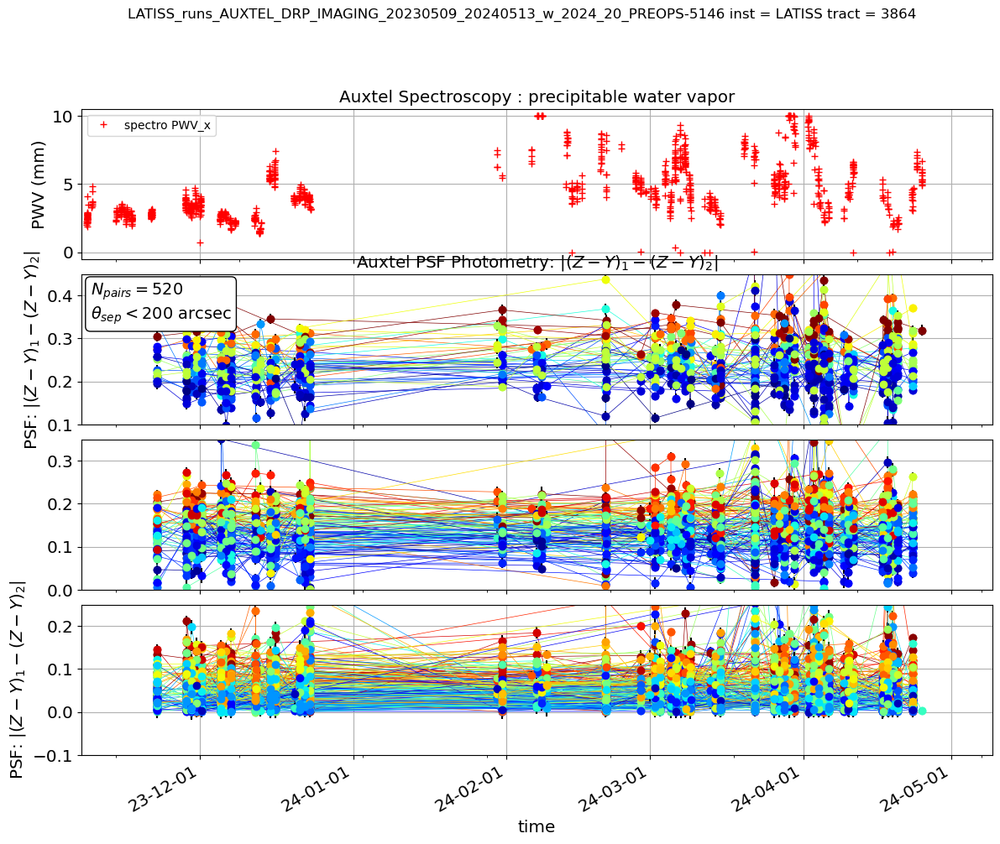

In [56]:
from matplotlib.dates import DateFormatter
#date_form = DateFormatter("%y-%m-%dT%H:%M")
date_form = DateFormatter("%y-%m-%d")
#fig,axs = plt.subplots(2,1,figsize=(14,8),sharex=True)

fig = plt.figure(figsize=(14,10),constrained_layout=True)
gs = GridSpec(4, 1, wspace=0, hspace=0.1, height_ratios=[1,1,1,1],figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1],sharex=ax1)
ax3 = fig.add_subplot(gs[2],sharex=ax1)
ax4 = fig.add_subplot(gs[3],sharex=ax1)

## ax1
df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="spectro PWV_x")

all_tmin = []
all_tmax = []

## ax2 ##

#Colormap
DCOLMIN = 0.2
DCOLMAX = 0.3
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=DCOLMIN, vmax=DCOLMAX)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

for idx,df_col in enumerate(all_colors_diff):
    if(len(df_col)>5):
        the_relativecolor = all_objectplotcolor[idx] 
        if the_relativecolor> DCOLMIN :
            the_color = scalarMap.to_rgba(the_relativecolor, alpha=1)
            df_col.plot(x="time1",y="psfcol12_s12",ax=ax2,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
            ax2.errorbar(df_col.time1,df_col.psfcol12_s12,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")

            tmin = df_col["time1"].min()
            tmax = df_col["time1"].max()
            dt = tmax-tmin
            tmin = tmin-dt/10
            tmax = tmax+dt/10
            all_tmin.append(tmin)
            all_tmax.append(tmax)

ax2.set_ylim(DCOLMIN-0.1,DCOLMAX+0.15)

## ax3

#Colormap
DCOLMIN = 0.1
DCOLMAX = 0.2
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=DCOLMIN, vmax=DCOLMAX)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

for idx,df_col in enumerate(all_colors_diff):
    if(len(df_col)>5):
        the_relativecolor = all_objectplotcolor[idx] 
        if the_relativecolor> DCOLMIN  and  the_relativecolor<= DCOLMAX:
            the_color = scalarMap.to_rgba(the_relativecolor, alpha=1)
            df_col.plot(x="time1",y="psfcol12_s12",ax=ax3,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
            ax3.errorbar(df_col.time1,df_col.psfcol12_s12,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")

            tmin = df_col["time1"].min()
            tmax = df_col["time1"].max()
            dt = tmax-tmin
            tmin = tmin-dt/10
            tmax = tmax+dt/10
            all_tmin.append(tmin)
            all_tmax.append(tmax)

ax3.set_ylim(DCOLMIN-0.1,DCOLMAX+0.15)
## ax4

#Colormap
DCOLMIN = 0.
DCOLMAX = 0.1
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=DCOLMIN, vmax=DCOLMAX)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

for idx,df_col in enumerate(all_colors_diff):
    if(len(df_col)>5):
        the_relativecolor = all_objectplotcolor[idx] 
        if the_relativecolor> DCOLMIN  and  the_relativecolor<= DCOLMAX:
            the_color = scalarMap.to_rgba(the_relativecolor, alpha=1)
            df_col.plot(x="time1",y="psfcol12_s12",ax=ax4,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
            ax4.errorbar(df_col.time1,df_col.psfcol12_s12,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")

            tmin = df_col["time1"].min()
            tmax = df_col["time1"].max()
            dt = tmax-tmin
            tmin = tmin-dt/10
            tmax = tmax+dt/10
            all_tmin.append(tmin)
            all_tmax.append(tmax)

ax4.set_ylim(DCOLMIN-0.1,DCOLMAX+0.15)

ax4.set_xlabel("time")
ax4.xaxis.set_major_formatter(date_form)

the_tmin=np.min(all_tmin)
the_tmax=np.max(all_tmax)

ax4.set_xlim(the_tmin,the_tmax)
ax2.set_title("Auxtel PSF Photometry: $|(Z-Y)_1-(Z-Y)_2|$")
ax1.legend(loc="upper left")
ax1.set_ylabel("PWV (mm)")
ax1.set_title("Auxtel Spectroscopy : precipitable water vapor")
#ax2.legend(loc="upper left")
ax2.set_ylabel("PSF: $|(Z-Y)_1-(Z-Y)_2|$")
ax4.set_ylabel("PSF: $|(Z-Y)_1-(Z-Y)_2|$")
ax2.text(0.01, 0.95, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)


title = suptitle
plt.suptitle(title,y=1.)
plt.tight_layout()

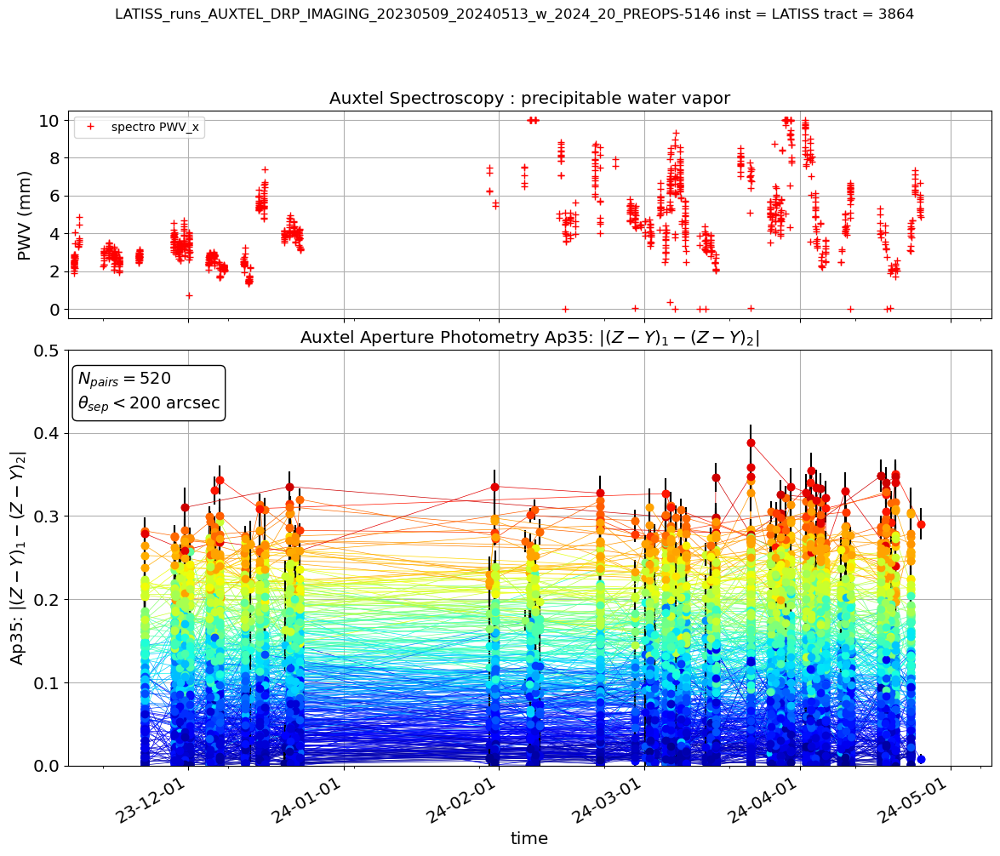

In [57]:
from matplotlib.dates import DateFormatter
#date_form = DateFormatter("%y-%m-%dT%H:%M")
date_form = DateFormatter("%y-%m-%d")
#fig,axs = plt.subplots(2,1,figsize=(14,8),sharex=True)

fig = plt.figure(figsize=(14,10),constrained_layout=True)
gs = GridSpec(2, 1, wspace=0, hspace=0.1, height_ratios=[1,2],figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1],sharex=ax1)


df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="spectro PWV_x")

all_tmin = []
all_tmax = []

for idx,df_col in enumerate(all_colors_diff):
    the_color = all_colors[idx]

    if(len(df_col)>5):
        df_col.plot(x="time1",y="apcol12_s12",ax=ax2,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
        ax2.errorbar(df_col.time1,df_col.apcol12_s12,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")

        tmin = df_col["time1"].min()
        tmax = df_col["time1"].max()
        dt = tmax-tmin
        tmin = tmin-dt/10
        tmax = tmax+dt/10
        all_tmin.append(tmin)
        all_tmax.append(tmax)

ax2.set_xlabel("time")
ax2.xaxis.set_major_formatter(date_form)

the_tmin=np.min(all_tmin)
the_tmax=np.max(all_tmax)

ax2.set_xlim(the_tmin,the_tmax)
ax2.set_title("Auxtel Aperture Photometry Ap35: $|(Z-Y)_1-(Z-Y)_2|$")
ax1.legend(loc="upper left")
ax1.set_ylabel("PWV (mm)")
ax1.set_title("Auxtel Spectroscopy : precipitable water vapor")
#ax2.legend(loc="upper left")
ax2.set_ylabel("Ap35: $|(Z-Y)_1-(Z-Y)_2|$")
ax2.set_ylim(0.,0.5)
ax2.text(0.01, 0.95, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)

title = suptitle
plt.suptitle(title,y=1.)
plt.tight_layout()

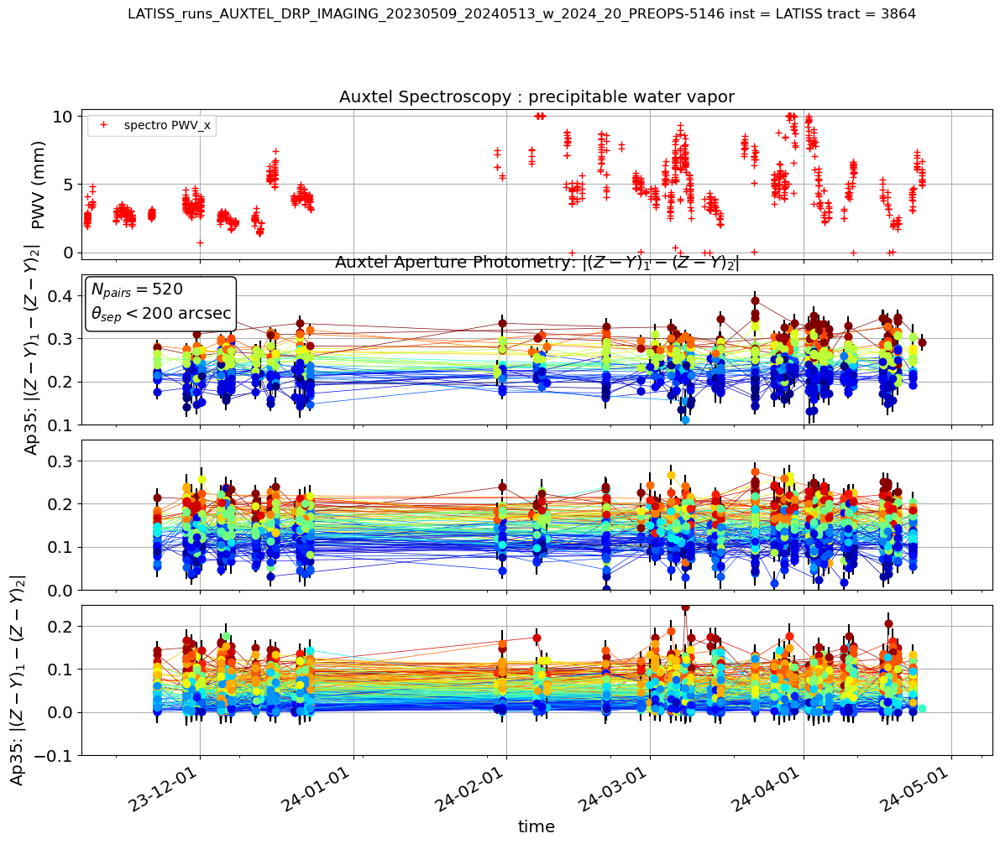

In [58]:
from matplotlib.dates import DateFormatter
#date_form = DateFormatter("%y-%m-%dT%H:%M")
date_form = DateFormatter("%y-%m-%d")
#fig,axs = plt.subplots(2,1,figsize=(14,8),sharex=True)

fig = plt.figure(figsize=(14,10),constrained_layout=True)
gs = GridSpec(4, 1, wspace=0, hspace=0.1, height_ratios=[1,1,1,1],figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1],sharex=ax1)
ax3 = fig.add_subplot(gs[2],sharex=ax1)
ax4 = fig.add_subplot(gs[3],sharex=ax1)

## ax1
df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="spectro PWV_x")

all_tmin = []
all_tmax = []

## ax2 ##

#Colormap
DCOLMIN = 0.2
DCOLMAX = 0.3
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=DCOLMIN, vmax=DCOLMAX)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

for idx,df_col in enumerate(all_colors_diff):
    if(len(df_col)>5):
        the_relativecolor = all_objectplotcolor[idx] 
        if the_relativecolor> DCOLMIN :
            the_color = scalarMap.to_rgba(the_relativecolor, alpha=1)
            df_col.plot(x="time1",y="apcol12_s12",ax=ax2,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
            ax2.errorbar(df_col.time1,df_col.apcol12_s12,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")

            tmin = df_col["time1"].min()
            tmax = df_col["time1"].max()
            dt = tmax-tmin
            tmin = tmin-dt/10
            tmax = tmax+dt/10
            all_tmin.append(tmin)
            all_tmax.append(tmax)

ax2.set_ylim(DCOLMIN-0.1,DCOLMAX+0.15)

## ax3

#Colormap
DCOLMIN = 0.1
DCOLMAX = 0.2
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=DCOLMIN, vmax=DCOLMAX)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

for idx,df_col in enumerate(all_colors_diff):
    if(len(df_col)>5):
        the_relativecolor = all_objectplotcolor[idx] 
        if the_relativecolor> DCOLMIN  and  the_relativecolor<= DCOLMAX:
            the_color = scalarMap.to_rgba(the_relativecolor, alpha=1)
            df_col.plot(x="time1",y="apcol12_s12",ax=ax3,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
            ax3.errorbar(df_col.time1,df_col.apcol12_s12,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")

            tmin = df_col["time1"].min()
            tmax = df_col["time1"].max()
            dt = tmax-tmin
            tmin = tmin-dt/10
            tmax = tmax+dt/10
            all_tmin.append(tmin)
            all_tmax.append(tmax)

ax3.set_ylim(DCOLMIN-0.1,DCOLMAX+0.15)
## ax4

#Colormap
DCOLMIN = 0.
DCOLMAX = 0.1
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=DCOLMIN, vmax=DCOLMAX)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)

for idx,df_col in enumerate(all_colors_diff):
    if(len(df_col)>5):
        the_relativecolor = all_objectplotcolor[idx] 
        if the_relativecolor> DCOLMIN  and  the_relativecolor<= DCOLMAX:
            the_color = scalarMap.to_rgba(the_relativecolor, alpha=1)
            df_col.plot(x="time1",y="apcol12_s12",ax=ax4,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
            ax4.errorbar(df_col.time1,df_col.apcol12_s12,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")

            tmin = df_col["time1"].min()
            tmax = df_col["time1"].max()
            dt = tmax-tmin
            tmin = tmin-dt/10
            tmax = tmax+dt/10
            all_tmin.append(tmin)
            all_tmax.append(tmax)

ax4.set_ylim(DCOLMIN-0.1,DCOLMAX+0.15)

ax4.set_xlabel("time")
ax4.xaxis.set_major_formatter(date_form)

the_tmin=np.min(all_tmin)
the_tmax=np.max(all_tmax)

ax4.set_xlim(the_tmin,the_tmax)
ax2.set_title("Auxtel Aperture Photometry: $|(Z-Y)_1-(Z-Y)_2|$")
ax1.legend(loc="upper left")
ax1.set_ylabel("PWV (mm)")
ax1.set_title("Auxtel Spectroscopy : precipitable water vapor")
#ax2.legend(loc="upper left")
ax2.set_ylabel("Ap35: $|(Z-Y)_1-(Z-Y)_2|$")
ax4.set_ylabel("Ap35: $|(Z-Y)_1-(Z-Y)_2|$")
ax2.text(0.01, 0.95, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)


title = suptitle
plt.suptitle(title,y=1.)
plt.tight_layout()

## Check if spread varies with (Z-Y) relative difference

In [59]:
df_summary

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap
0,0.0,141.0,907.0,7.0,0.089904,39.0,0.095301,39.0,0.095078,0.026872,39.0,14.677654,-0.005396
1,1.0,654.0,669.0,10.0,0.157383,25.0,0.157931,25.0,0.159177,0.021111,25.0,14.137261,-0.000548
2,2.0,111.0,262.0,16.0,0.094064,34.0,0.097442,34.0,0.100023,0.026601,34.0,14.934727,-0.003378
3,3.0,813.0,950.0,16.0,0.134367,27.0,0.139636,27.0,0.140848,0.034404,27.0,14.907334,-0.005269
4,4.0,64.0,262.0,18.0,0.073242,10.0,0.093076,10.0,0.099348,0.036333,10.0,14.993679,-0.019834
...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,516.0,109.0,201.0,199.0,0.026078,46.0,0.027036,46.0,0.034685,0.026174,46.0,14.872735,-0.000958
490,517.0,272.0,433.0,199.0,0.088261,11.0,0.064407,11.0,0.063870,0.022416,11.0,14.492526,0.023854
491,518.0,865.0,958.0,199.0,0.079293,9.0,0.125226,9.0,0.119368,0.020230,9.0,14.057159,-0.045933
492,519.0,123.0,470.0,199.0,0.125989,11.0,0.136270,11.0,0.137538,0.022049,11.0,14.013569,-0.010281


In [60]:
for index in range(len(df_summary["idx_pair"])):
    #print(df_summary.iloc[index][["idx_pair","idx_obj1","idx_obj2"]])
    text = "{:}){:}({:},{:})".format(index, int(df_summary.iloc[index]["idx_pair"]), int(df_summary.iloc[index]["idx_obj1"]),int(df_summary.iloc[index]["idx_obj2"]))
    #print(text)

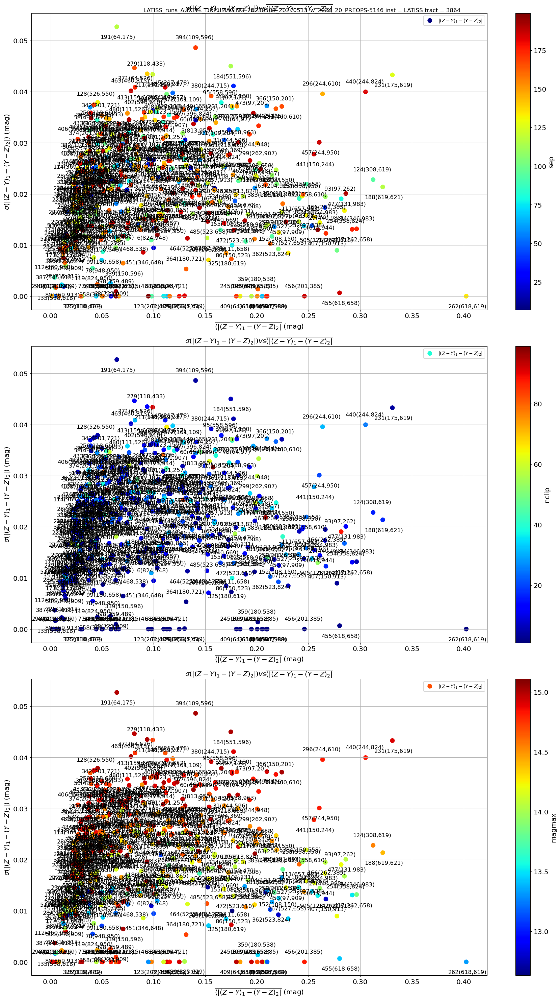

In [61]:
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(18,30))
title = f"AuxtelLightCurves"


sc1=df_summary.plot.scatter(x= "muclip",y="sigmaclip",ax=ax1,s=80, c= "sep",cmap="jet", label="$|(Z-Y)_1 - (Y-Z)_2|$", grid=True,colorbar=True)
sc2=df_summary.plot.scatter(x= "muclip",y="sigmaclip",ax=ax2,s=80, c= "nclip",cmap="jet", label="$|(Z-Y)_1 - (Y-Z)_2|$", grid=True,colorbar=True)
sc3=df_summary.plot.scatter(x= "muclip",y="sigmaclip",ax=ax3,s=80, c= "magmax",cmap="jet", label="$|(Z-Y)_1 - (Y-Z)_2|$", grid=True,colorbar=True)

ax1.set_title(title)
ax1.set_title("$\\sigma (|(Z-Y)_1 - (Y-Z)_2|) vs \overline{(|(Z-Y)_1 - (Y-Z)_2|}$")
ax1.set_xlabel("$\overline{(|(Z-Y)_1 - (Y-Z)_2|}$ (mag)")
ax1.set_ylabel("$\\sigma (|(Z-Y)_1 - (Y-Z)_2|) $ (mag)")



ax2.set_title("$\\sigma (|(Z-Y)_1 - (Y-Z)_2|) vs \overline{(|(Z-Y)_1 - (Y-Z)_2|}$")
ax2.set_xlabel("$\overline{(|(Z-Y)_1 - (Y-Z)_2|}$ (mag)")
ax2.set_ylabel("$\\sigma (|(Z-Y)_1 - (Y-Z)_2|) $ (mag)")


ax3.set_title("$\\sigma (|(Z-Y)_1 - (Y-Z)_2|) vs \overline{(|(Z-Y)_1 - (Y-Z)_2|}$")
ax3.set_xlabel("$\overline{(|(Z-Y)_1 - (Y-Z)_2|}$ (mag)")
ax3.set_ylabel("$\\sigma (|(Z-Y)_1 - (Y-Z)_2|) $ (mag)")

#cbar1 = plt.colorbar(ax1.collections[0],ax=ax1,orientation = 'horizontal',shrink=0.6)
#cbar1 = plt.colorbar(ax1.collections[0],ax=ax1,orientation = 'horizontal',shrink=0.6)
#cbar1.ax.set_xlabel('angular separation (arcsec)',rotation=0)

#cbar2 = plt.colorbar(ax2.collections[0],ax=ax2,orientation = 'horizontal',shrink=0.6)
#cbar2.ax.set_xlabel('number of points',rotation=0)

for index in range(len(df_summary["idx_pair"])):
    #print(df_summary.iloc[index][["idx_pair","idx_obj1","idx_obj2"]])
    text = "{:}({:},{:})".format( int(df_summary.iloc[index]["idx_pair"]), int(df_summary.iloc[index]["idx_obj1"]),int(df_summary.iloc[index]["idx_obj2"]))

    x = df_summary.iloc[index]["muclip"]
    y = df_summary.iloc[index]["sigmaclip"]
    
    if index%2 == 0:
        ax1.text(x-0.001,y+.002,text,size= 'large',horizontalalignment='center',verticalalignment='center')
        ax2.text(x-0.001,y+.002,text,size= 'large',horizontalalignment='center',verticalalignment='center')
        ax3.text(x-0.001,y+.002,text,size= 'large',horizontalalignment='center',verticalalignment='center')
    else:
        ax1.text(x+0.001,y-0.002,text,size= 'large',horizontalalignment='center',verticalalignment='center')
        ax2.text(x+0.001,y-0.002,text,size= 'large',horizontalalignment='center',verticalalignment='center')
        ax3.text(x+0.001,y-0.002,text,size= 'large',horizontalalignment='center',verticalalignment='center')

plt.suptitle(suptitle)
plt.tight_layout()
plt.show()


Text(0, 0.5, '$\\sigma(|(Z-Y)_1 - (Z-Y)_2|$ (mag)')

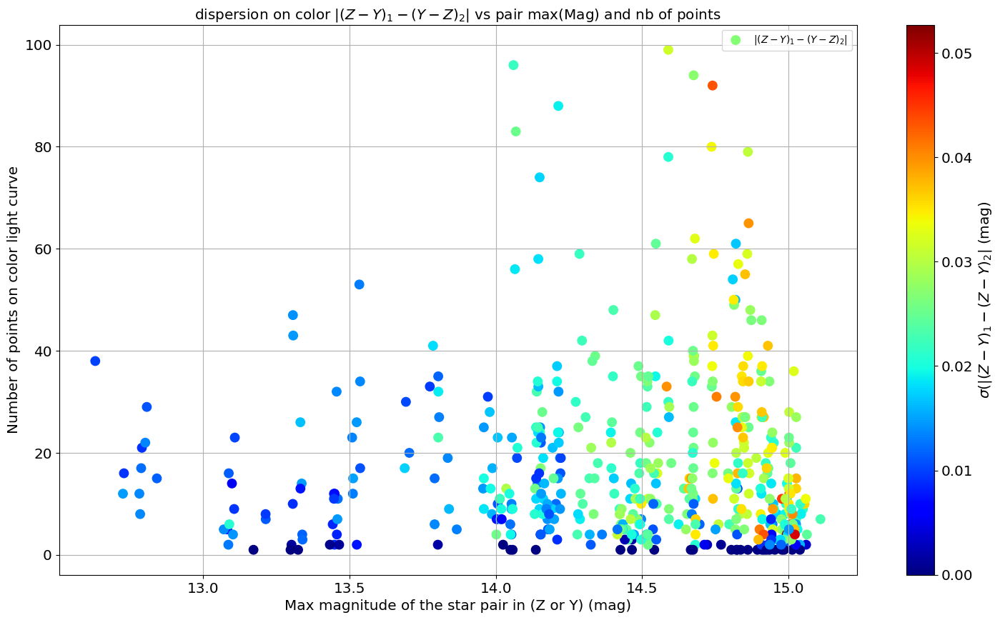

In [62]:
fig, ax1 = plt.subplots(1,1,figsize=(18,10))
title = f"AuxtelLightCurves"


sc1=df_summary.plot.scatter(x= "magmax",y="nclip",ax=ax1,s=80, c= "sigmaclip",cmap="jet", label="$|(Z-Y)_1 - (Y-Z)_2|$", grid=True,colorbar=True)
ax1.set_title("dispersion on color $|(Z-Y)_1 - (Y-Z)_2|$ vs pair max(Mag) and nb of points")
ax1.set_xlabel("Max magnitude of the star pair in (Z or Y) (mag)")
ax1.set_ylabel("Number of points on color light curve")


f = plt.gcf()
cax = f.get_axes()[1]
#and we can modify it, i.e.:
cax.set_ylabel('$\sigma(|(Z-Y)_1 - (Z-Y)_2|$ (mag)')

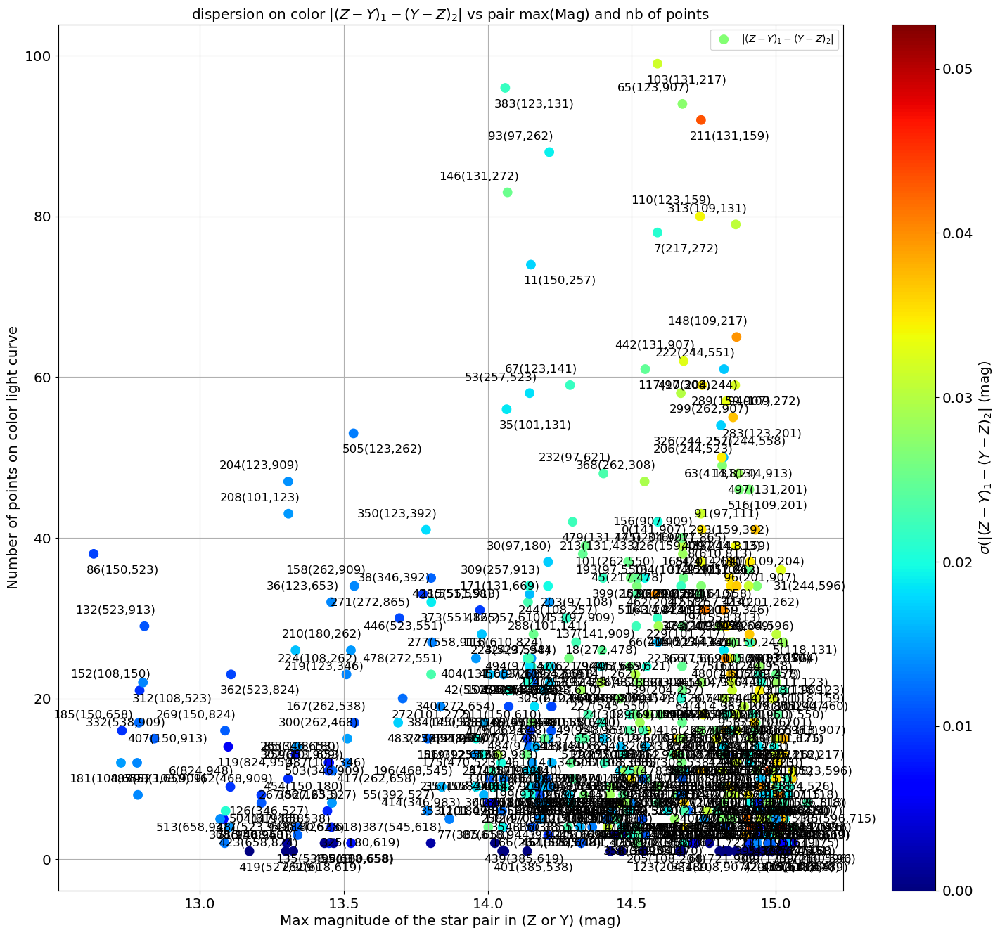

In [63]:
fig, ax1 = plt.subplots(1,1,figsize=(18,16))
title = f"AuxtelLightCurves"


sc1=df_summary.plot.scatter(x= "magmax",y="nclip",ax=ax1,s=80, c= "sigmaclip",cmap="jet", label="$|(Z-Y)_1 - (Y-Z)_2|$", grid=True,colorbar=True)
ax1.set_title("dispersion on color $|(Z-Y)_1 - (Y-Z)_2|$ vs pair max(Mag) and nb of points")
ax1.set_xlabel("Max magnitude of the star pair in (Z or Y) (mag)")
ax1.set_ylabel("Number of points on color light curve")


f = plt.gcf()
cax = f.get_axes()[1]
#and we can modify it, i.e.:
cax.set_ylabel('$\sigma(|(Z-Y)_1 - (Y-Z)_2|$ (mag)')
for index in range(len(df_summary["idx_pair"])):
    #print(df_summary.iloc[index][["idx_pair","idx_obj1","idx_obj2"]])
    text = "{:}({:},{:})".format( int(df_summary.iloc[index]["idx_pair"]), int(df_summary.iloc[index]["idx_obj1"]),int(df_summary.iloc[index]["idx_obj2"]))

    x = df_summary.iloc[index]["magmax"]
    y = df_summary.iloc[index]["nclip"]
    
    if index%2 == 0:
        ax1.text(x-0.1,y+2,text,size= 'large',horizontalalignment='center',verticalalignment='center')
    else:
        ax1.text(x+0.1,y-2,text,size= 'large',horizontalalignment='center',verticalalignment='center')

## Select good pairs

In [80]:
#df_summary_sel = df_summary.assign(select = lambda row : (row["magmax"]<14.5) & (row["nclip"]>20) & (row["refcol_ap_md"]>0.05))
#df_summary_sel = df_summary.assign(select = lambda row : (row["magmax"]<14.5) & (row["nclip"]>20) )
df_summary_sel = df_summary.assign(select = lambda row : (row["magmax"]<14.5) & (row["nclip"]>20) & (row["refcol_ap_md"]>0.25) )

In [82]:
df_summary_.assign(select = lambda row : (row["magmax"]<14.5) & (row["nclip"]>20) & (row["refcol_ap_md"]>0.25) )

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap,selection_good,select
0,0.0,141.0,907.0,7.0,0.089904,39.0,0.095301,39.0,0.095078,0.026872,39.0,14.677654,-0.005396,False,False
1,1.0,654.0,669.0,10.0,0.157383,25.0,0.157931,25.0,0.159177,0.021111,25.0,14.137261,-0.000548,False,False
2,2.0,111.0,262.0,16.0,0.094064,34.0,0.097442,34.0,0.100023,0.026601,34.0,14.934727,-0.003378,False,False
3,3.0,813.0,950.0,16.0,0.134367,27.0,0.139636,27.0,0.140848,0.034404,27.0,14.907334,-0.005269,False,False
4,4.0,64.0,262.0,18.0,0.073242,10.0,0.093076,10.0,0.099348,0.036333,10.0,14.993679,-0.019834,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,516.0,109.0,201.0,199.0,0.026078,46.0,0.027036,46.0,0.034685,0.026174,46.0,14.872735,-0.000958,False,False
490,517.0,272.0,433.0,199.0,0.088261,11.0,0.064407,11.0,0.063870,0.022416,11.0,14.492526,0.023854,False,False
491,518.0,865.0,958.0,199.0,0.079293,9.0,0.125226,9.0,0.119368,0.020230,9.0,14.057159,-0.045933,False,False
492,519.0,123.0,470.0,199.0,0.125989,11.0,0.136270,11.0,0.137538,0.022049,11.0,14.013569,-0.010281,False,False


In [81]:
df_summary_sel

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap,selection_good,select
0,0.0,141.0,907.0,7.0,0.089904,39.0,0.095301,39.0,0.095078,0.026872,39.0,14.677654,-0.005396,False,False
1,1.0,654.0,669.0,10.0,0.157383,25.0,0.157931,25.0,0.159177,0.021111,25.0,14.137261,-0.000548,False,False
2,2.0,111.0,262.0,16.0,0.094064,34.0,0.097442,34.0,0.100023,0.026601,34.0,14.934727,-0.003378,False,False
3,3.0,813.0,950.0,16.0,0.134367,27.0,0.139636,27.0,0.140848,0.034404,27.0,14.907334,-0.005269,False,False
4,4.0,64.0,262.0,18.0,0.073242,10.0,0.093076,10.0,0.099348,0.036333,10.0,14.993679,-0.019834,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,516.0,109.0,201.0,199.0,0.026078,46.0,0.027036,46.0,0.034685,0.026174,46.0,14.872735,-0.000958,False,False
490,517.0,272.0,433.0,199.0,0.088261,11.0,0.064407,11.0,0.063870,0.022416,11.0,14.492526,0.023854,False,False
491,518.0,865.0,958.0,199.0,0.079293,9.0,0.125226,9.0,0.119368,0.020230,9.0,14.057159,-0.045933,False,False
492,519.0,123.0,470.0,199.0,0.125989,11.0,0.136270,11.0,0.137538,0.022049,11.0,14.013569,-0.010281,False,False


In [66]:
good_indexes = df_summary_sel[df_summary_sel["select"]]["idx_pair"].values.astype(int)
print("good_indexes ",good_indexes)
Ngood = len(good_indexes)

good_indexes  [ 36  93 121 254 505]


In [83]:
df_summary["selection_good"] = df_summary.apply(lambda row : int(row["idx_pair"]) in good_indexes ,axis=1)

In [84]:
df_summary[df_summary["selection_good"]]

,idx_pair,idx_obj1,idx_obj2,sep,refcol_psf_md,n_refcol_psf,refcol_ap_md,n_refcol_ap,muclip,sigmaclip,nclip,magmax,drefcol_psf_ap,selection_good
36,36.0,123.0,653.0,48.0,0.248857,32.0,0.253628,32.0,0.253206,0.013784,32.0,13.456232,-0.004771,True
92,93.0,97.0,262.0,80.0,0.275624,88.0,0.279843,88.0,0.281531,0.019038,88.0,14.213496,-0.004219,True
119,121.0,558.0,610.0,92.0,0.263847,24.0,0.251677,24.0,0.247840,0.021907,24.0,14.151241,0.012169,True
243,254.0,558.0,824.0,132.0,0.311920,23.0,0.283753,23.0,0.284725,0.016755,23.0,14.006411,0.028167,True
479,505.0,123.0,262.0,196.0,0.222358,53.0,0.258168,53.0,0.258890,0.012978,53.0,13.533764,-0.035810,True


<Axes: >

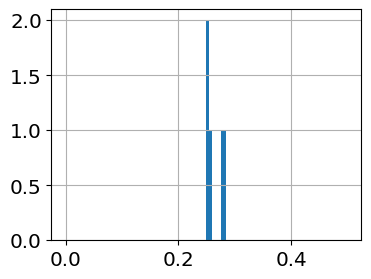

In [86]:
df_summary["refcol_ap_md"][df_summary["selection_good"]].hist(bins=100,range=(0,0.5))

In [87]:
props = dict(boxstyle='round', facecolor="white", alpha=1)
textstr0 = '\n'.join((
    r'$N_{pairs}=%.0f$' % (len(good_indexes), ),
    r'$\theta_{sep}<%.0f$ arcsec' % (sep_max, )))

In [88]:
# wavelength bin colors
jet = plt.get_cmap('jet')
cNorm = mpl.colors.Normalize(vmin=0, vmax=0.3)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(all_objectplotcolor, alpha=1)

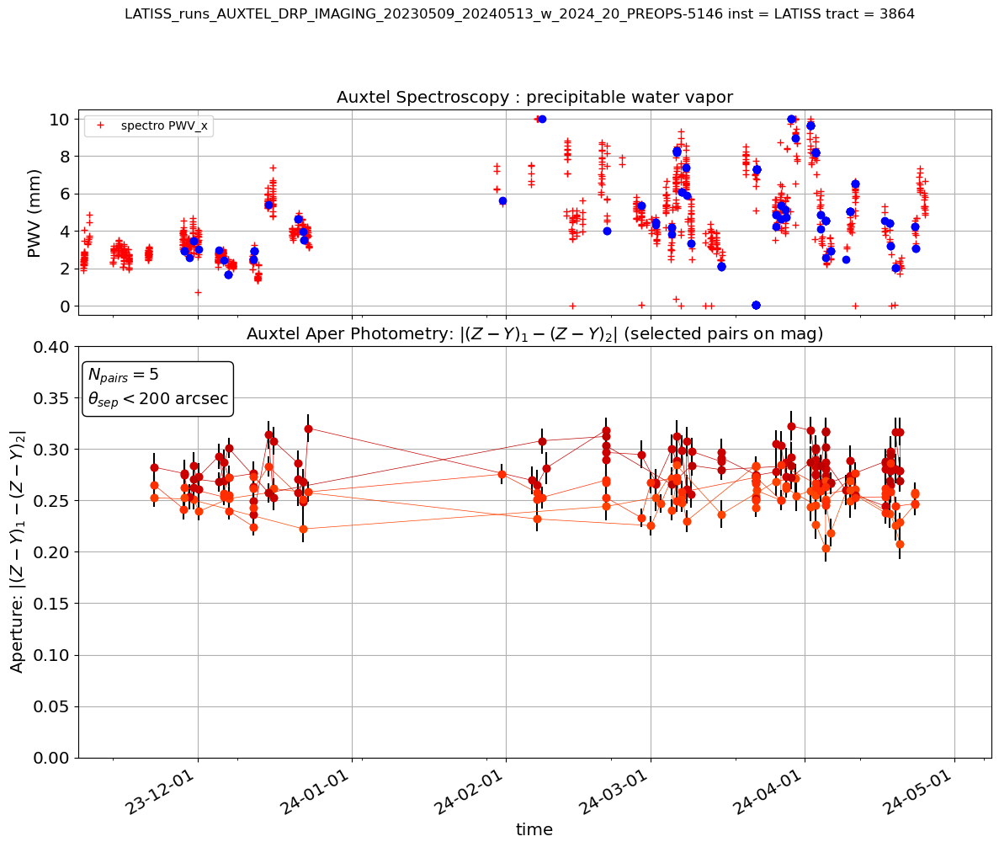

In [89]:
from matplotlib.dates import DateFormatter
#date_form = DateFormatter("%y-%m-%dT%H:%M")
date_form = DateFormatter("%y-%m-%d")
#fig,axs = plt.subplots(2,1,figsize=(14,8),sharex=True)

fig = plt.figure(figsize=(14,10),constrained_layout=True)
gs = GridSpec(2, 1, wspace=0, hspace=0.1, height_ratios=[1,2],figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1],sharex=ax1)


df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="spectro PWV_x")

all_tmin = []
all_tmax = []

for idx,df_col in enumerate(all_colors_diff):
    the_color = all_colors[idx]

    if idx in good_indexes:
        df_col.plot(x="time1",y="apcol12_s12",ax=ax2,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
        #ax2.errorbar(df_col.time1,df_col.psfcol12_s12,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")
        ax2.errorbar(df_col.time1,df_col.apcol12_s12,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")

        df_col.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker="o",c="b",lw=0.,grid=True,label="")
        
        tmin = df_col["time1"].min()
        tmax = df_col["time1"].max()
        dt = tmax-tmin
        tmin = tmin-dt/10
        tmax = tmax+dt/10
        all_tmin.append(tmin)
        all_tmax.append(tmax)


ax2.set_xlabel("time")
ax2.xaxis.set_major_formatter(date_form)

the_tmin=np.min(all_tmin)
the_tmax=np.max(all_tmax)

ax2.set_xlim(the_tmin,the_tmax)
ax2.set_title("Auxtel Aper Photometry: $|(Z-Y)_1-(Z-Y)_2|$ (selected pairs on mag)")
ax1.legend(loc="upper left")
ax1.set_ylabel("PWV (mm)")
ax1.set_title("Auxtel Spectroscopy : precipitable water vapor")
#ax2.legend(loc="upper left")
ax2.set_ylabel("Aperture: $|(Z-Y)_1-(Z-Y)_2|$")
ax2.set_ylim(0.,0.4)
ax2.text(0.01, 0.95, textstr0, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)

title = suptitle
plt.suptitle(title,y=1)
plt.tight_layout()

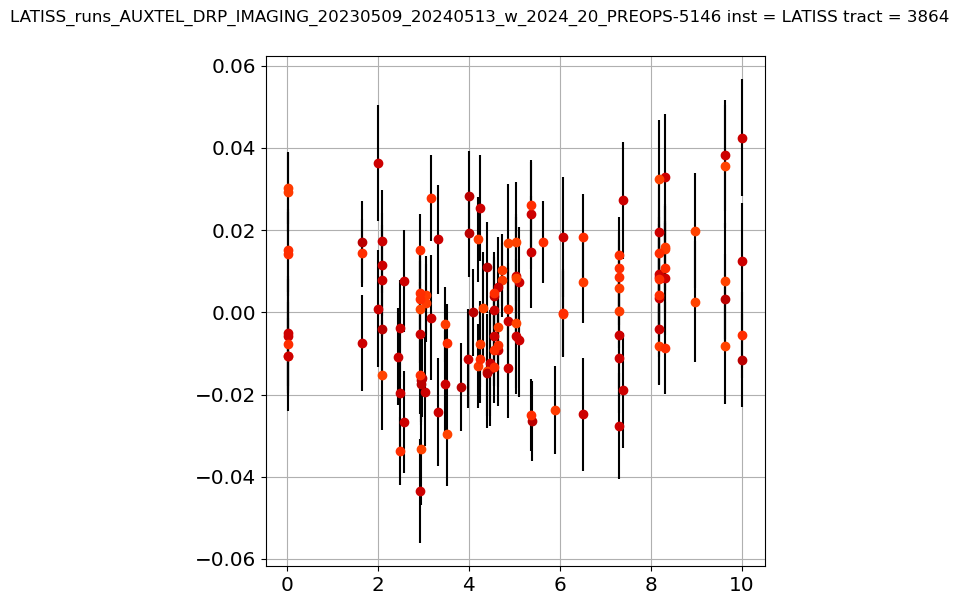

In [90]:

fig,ax  = plt.subplots(figsize=(6,6))


for idx_pair,df_col in enumerate(all_colors_diff):
    the_color = all_colors[idx_pair]

    if idx_pair in good_indexes:
        refcol_ap_md = (df_summary[df_summary["idx_pair"].astype(int) == idx_pair]["refcol_ap_md"]).values[0]
        #df_col.plot(x="PWV [mm]_x",y="apcol12_s12",ax=ax,marker="o",c=the_color,lw=0.5,grid=True,legend=False)
        #ax2.errorbar(df_col.time1,df_col.psfcol12_s12,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")
        ax.errorbar(df_col["PWV [mm]_x"],df_col.apcol12_s12-refcol_ap_md,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")
        
ax.grid()       
title = suptitle
plt.suptitle(title,y=1)
plt.tight_layout()

## Loop to plot relative light curves one by one and DO straight line fitting

In [91]:
def func_line(x, a, b):
    """
    straight line model
    """
    return a * x + b 
xfit = np.linspace(0.,10.,50)

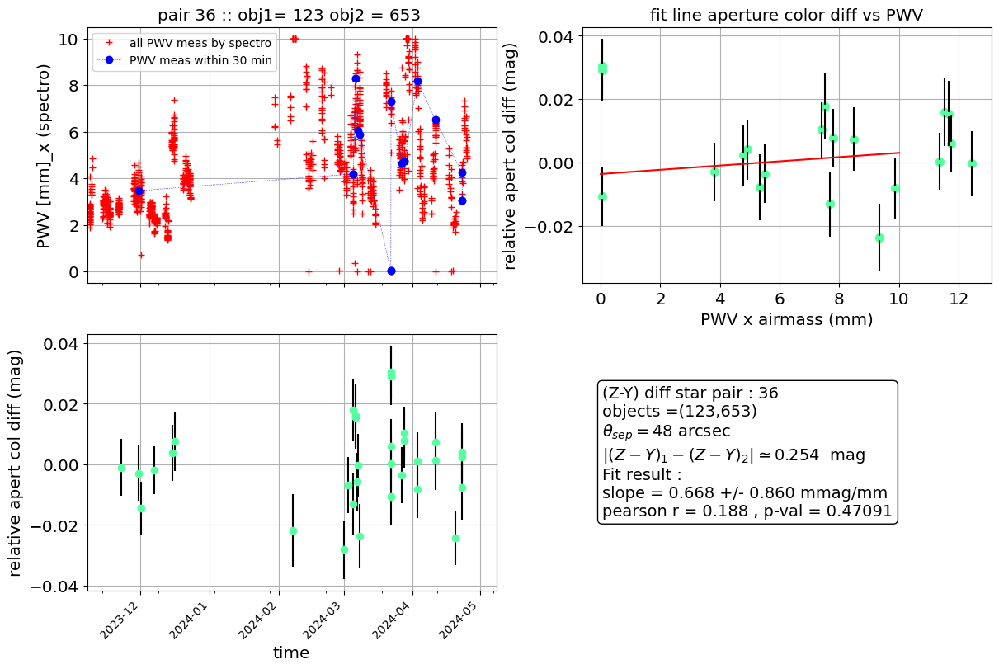

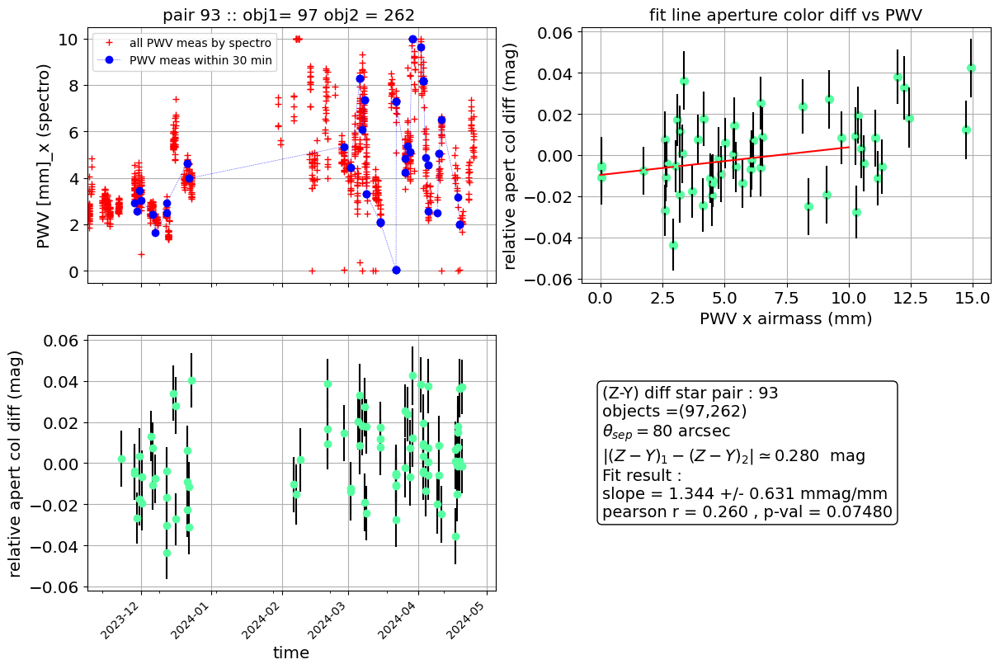

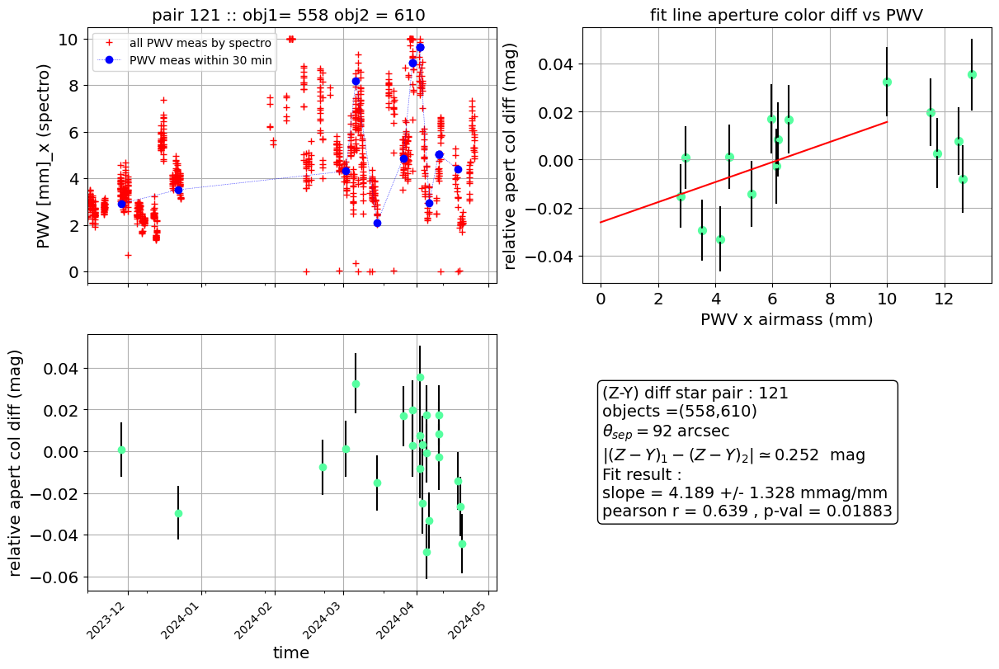

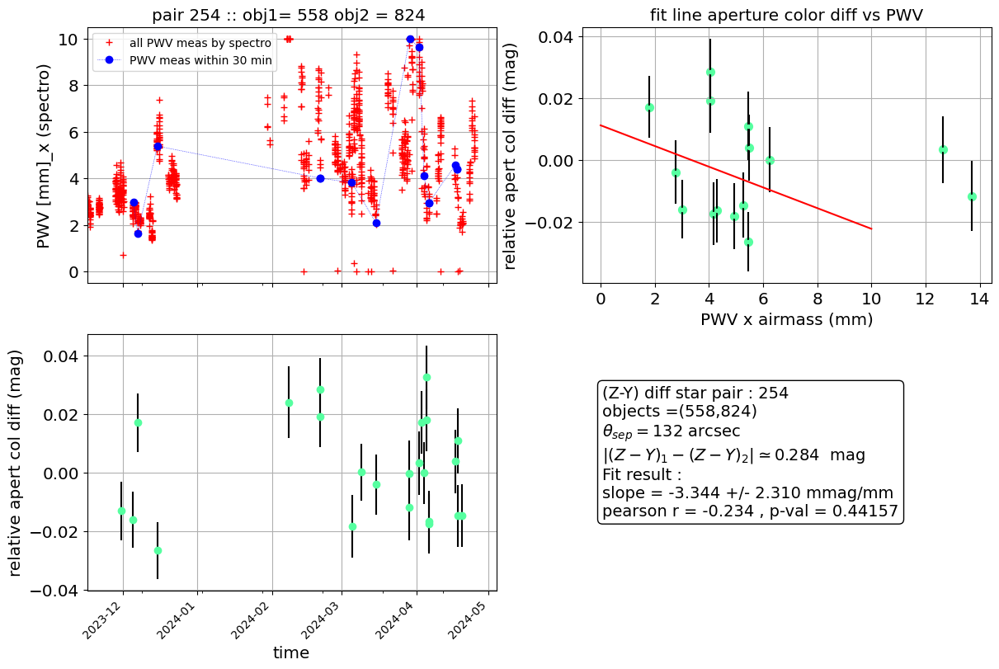

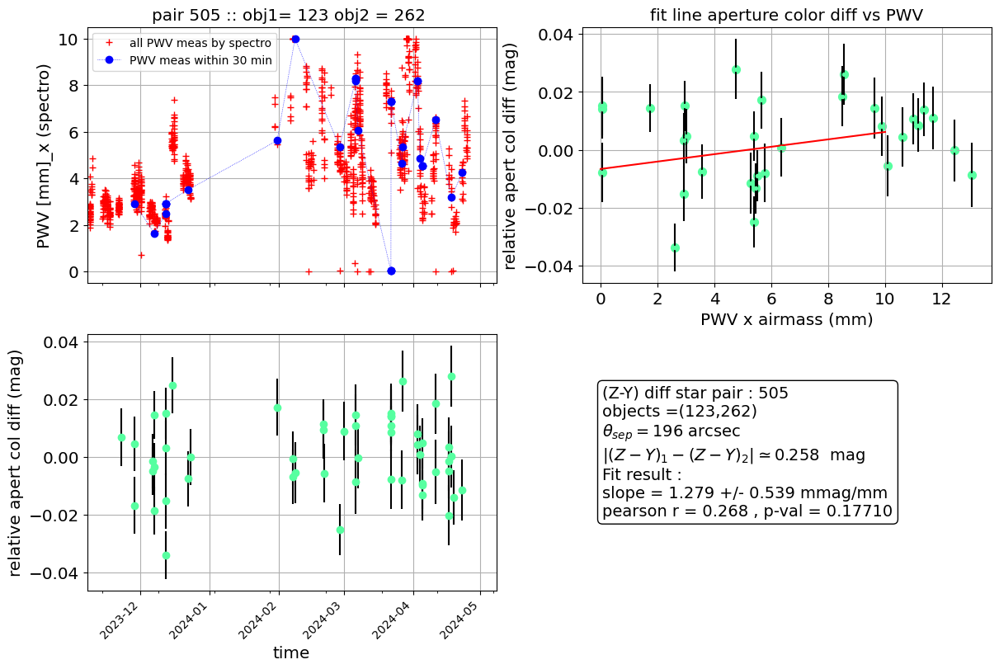

In [92]:
df_fit_ap = pd.DataFrame(columns=["idx_pair","idx_summary","color","slope","slope_err","sep"]) 

date_form = DateFormatter("%y-%m-%d")

count = 0
for good_idx in good_indexes:

    # decomposition of the figure in 4 subplots
    fig = plt.figure(figsize=(12,8),constrained_layout=True)
    gs = GridSpec(2, 2, wspace=0, hspace=0.01, height_ratios=[1,1],figure=fig)

    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[1,0],sharex=ax1)
    ax3 = fig.add_subplot(gs[0,1])
    ax4 = fig.add_subplot(gs[1,1])

    # subplot1: measurement of pwv in Auxtel
    # =========================================
    df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="all PWV meas by spectro")


    # get the light curve
    
    df_col = all_colors_diff[good_idx]
    # Extract the row in df_summary with the pair number good_idx
    df_summary_row = df_summary[df_summary["idx_pair"].astype(int) == good_idx]

    # extract the corresponding index and refcol_ap_md column
    index_in_summary = df_summary_row.index[0]
    refcol_ap_md = df_summary_row["refcol_ap_md"].values[0]

    
    # compute a recentered colors fro plotting
    df_col["relapcol"] = df_col.apcol12_s12-refcol_ap_md

    separation_angle = df_summary.loc[index_in_summary,"sep"]
  
    # compute the string
    textstr = '\n'.join((
    "(Z-Y) diff star pair :"
    r'objects =(%.0f,%.0f)' % (df_summary.loc[index_in_summary,"idx_obj1"],df_summary.loc[index_in_summary,"idx_obj2"],  ),
    r'$\theta_{sep} = %.0f$ arcsec' % (df_summary.loc[index_in_summary,"sep"], ),
    r'$|(Z-Y)_1- (Z-Y)_2| \simeq%.3f$  mag' % (df_summary.loc[index_in_summary,"refcol_ap_md"], )))

    title = "pair {} :: obj1= {} obj2 = {} ".format(good_idx,df_summary.loc[index_in_summary,"idx_obj1"].astype(int),
                                                    df_summary.loc[index_in_summary,"idx_obj2"].astype(int))
    ax1.set_title(title)
    ax1.set_ylabel("PWV [mm]_x (spectro)")
   
    
    # subplot2 : the ligth curve
    # ==========================
    ax2.errorbar(df_col.time1,df_col.apcol12_s12-refcol_ap_md,yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")
    df_col.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker="o",c="b",lw=0.5,ls=":",grid=True,label="PWV meas within 30 min")
    #ax2.text(0.01, 0.97, textstr, transform=ax2.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    ax2.set_ylabel("relative apert col diff (mag)")
    ax2.set_xlabel("time")
    
    
    #subplot3 : the attenuation vs pwv x airmass
    # ============================================
    X =  df_col["PWV [mm]_x"] *  df_col["airmassb1"]
    Y =  df_col["relapcol"]
    Xerr = df_col["PWV [mm]_err_x"]*df_col["airmassb1"]
    Yerr = df_col.apcol12Err_s12
    
    ax3.errorbar(X,Y,xerr=Xerr,yerr=Yerr,color=the_color,ecolor="k",fmt=".")
    ax3.scatter(X,Y,c=the_color,marker= "o",s=50)
    ax3.grid()
    
    ax3.set_xlabel("PWV x airmass (mm)")
    ax3.set_ylabel("relative apert col diff (mag)")
    ax3.set_title("fit line aperture color diff vs PWV")
    
    #ax4.errorbar(df_col["PWV [mm]_x"],df_col.relapcol,xerr=df_col["PWV [mm]_err_x"],yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")
    #ax4.grid()
    #ax4.set_xlabel("PWV [mm]_x (spectro)")
    
    # subplot 4 : No plot
    #===================
    ax4.set_axis_off()

    
    
    
    ## FIT
    ## =======
    idx_tofit = (~np.isnan(df_col["PWV [mm]_x"])) & (df_col["PWV [mm]_x"] >=1) & (df_col["PWV [mm]_x"] <=9) 
  
    Xfit = X[idx_tofit]
    Yfit = Y[idx_tofit]
    EYfit = Yerr[idx_tofit]
    pearsonr = scipy.stats.pearsonr(Xfit, Yfit) 
    spearmanr = scipy.stats.spearmanr(Xfit, Yfit)
   
    output_fit =  curve_fit(func_line,Xfit,Yfit,sigma=EYfit,p0= [0,0],absolute_sigma=True,method='lm',full_output=True)
    popt= output_fit[0]
    pcov = output_fit[1]
    perr = np.sqrt(np.diag(pcov))
    yfit = func_line(xfit,*popt)
    ax3.plot(xfit,yfit,'r-')
    textstr2 = '\n'.join((
    r'(Z-Y) diff star pair : %.0f' % (good_idx,),
    r'objects =(%.0f,%.0f)' % (df_summary.loc[index_in_summary,"idx_obj1"],df_summary.loc[index_in_summary,"idx_obj2"],  ),
    r'$\theta_{sep} = %.0f$ arcsec' % (df_summary.loc[index_in_summary,"sep"], ),
    r'$|(Z-Y)_1- (Z-Y)_2| \simeq%.3f$  mag' % (df_summary.loc[index_in_summary,"refcol_ap_md"], ),
    r"Fit result :",
    r'slope = %.3f +/- %.3f mmag/mm' % (1000*popt[0],1000*perr[0],),
    r'pearson r = %.3f , p-val = %.5f' % (pearsonr[0],pearsonr[1],),))
    #ax4.plot(xfit,yfit,'r-')
    ax4.text(0.05, 0.8, textstr2, transform=ax4.transAxes, fontsize=14,verticalalignment='top', bbox=props)

    df_fit_ap.loc[count] = [good_idx, index_in_summary, refcol_ap_md, popt[0]*1000, perr[0]*1000, separation_angle]  
    
    tmin = df_col["time1"].min()
    tmax = df_col["time1"].max()
    dt = tmax-tmin
    tmin = tmin-dt/10
    tmax = tmax+dt/10

    the_tmin=tmin
    the_tmax=tmax

    ax2.set_xlim(the_tmin,the_tmax)
    ax2.grid()
    #plt.xticks(rotation=45)
    ax2.set_xticks(ax2.get_xticks(), ax2.get_xticklabels(), rotation=45, ha='right',fontsize=10)
    plt.show()
    count += 1
    #if count > 2:
    #    break
   


## Plot slope vs color

In [93]:
df_fit_ap 

,idx_pair,idx_summary,color,slope,slope_err,sep
0,36.0,36.0,0.253628,0.667630,0.859727,48.0
1,93.0,92.0,0.279843,1.343932,0.630925,80.0
2,121.0,119.0,0.251677,4.189460,1.327801,92.0
3,254.0,243.0,0.283753,-3.343855,2.309855,132.0
4,505.0,479.0,0.258168,1.278741,0.538757,196.0


Text(0, 0.5, '$d(\\Delta C)/d(PWV)$ (mmag/mm) ')

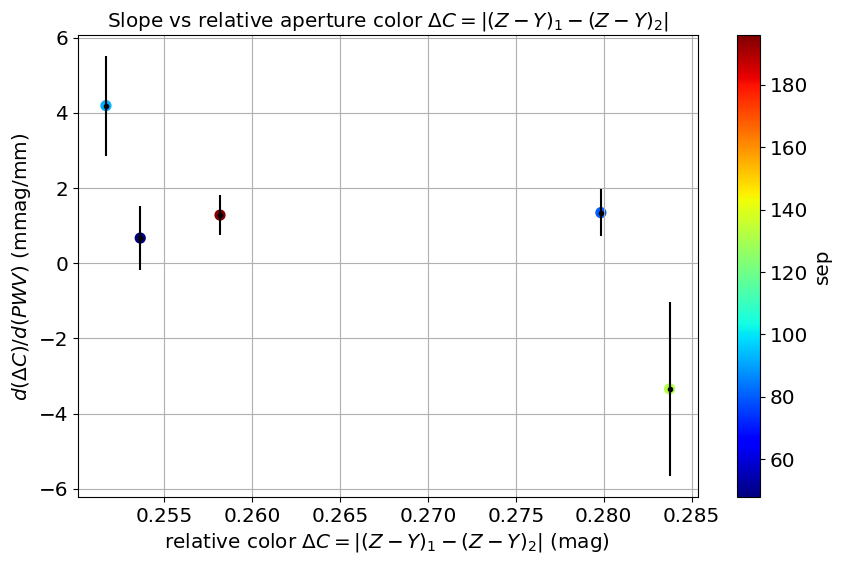

In [77]:
fig,ax  = plt.subplots(figsize=(10,6))
ax.errorbar(x=df_fit_ap["color"],y=df_fit_ap["slope"],yerr=df_fit_ap["slope_err"],ecolor="k",fmt=".",color="k") 
sc = df_fit_ap.plot.scatter(x="color",y="slope",c="sep",marker= "o",s=50,ax=ax,colormap="jet")
ax.grid()
#ax.set_ylim(-5.,10)
ax.set_title("Slope vs relative aperture color $\Delta C = |(Z-Y)_1- (Z-Y)_2|$")
ax.set_xlabel("relative color $\Delta C = |(Z-Y)_1- (Z-Y)_2|$ (mag) ")
ax.set_ylabel("$d(\Delta C)/d(PWV)$ (mmag/mm) ")
#cbar = plt.colorbar(sc)
#cbar.ax.set_xlabel('separation angle (arcsec)', rotation=0)

## PSF curves

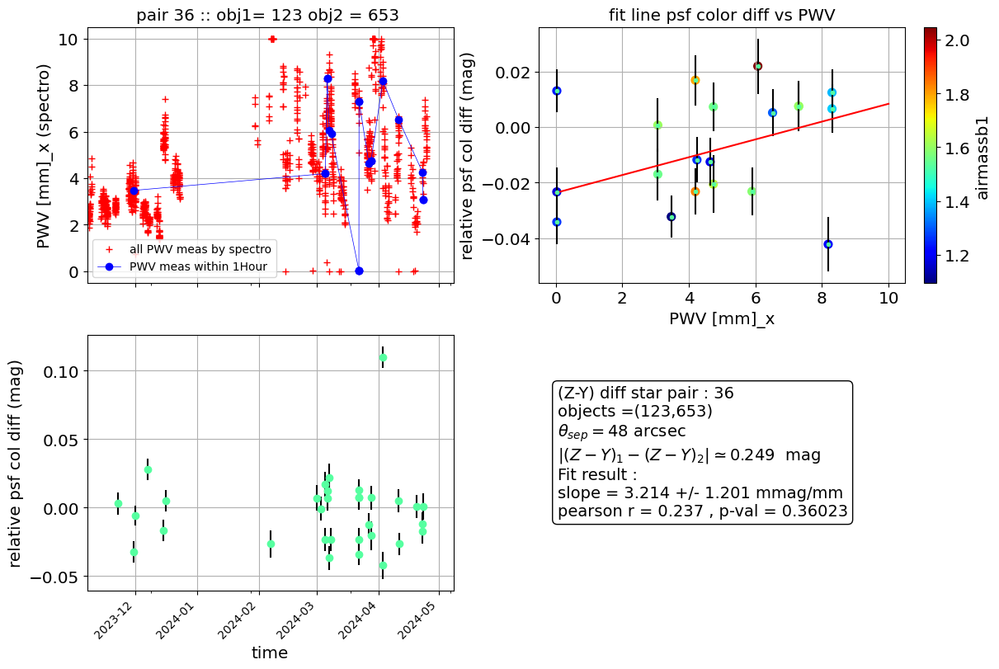

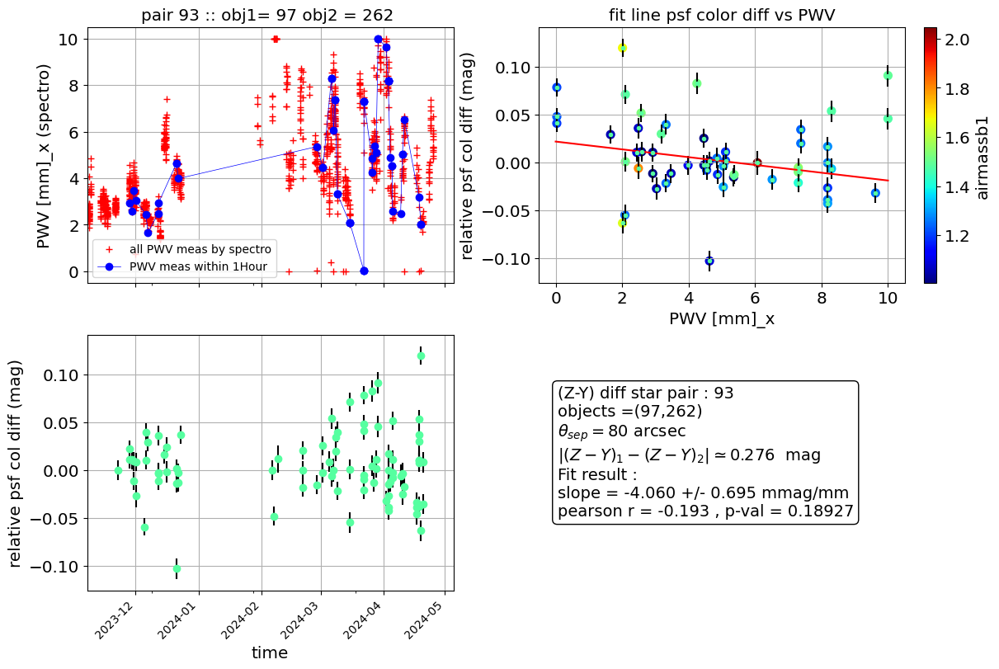

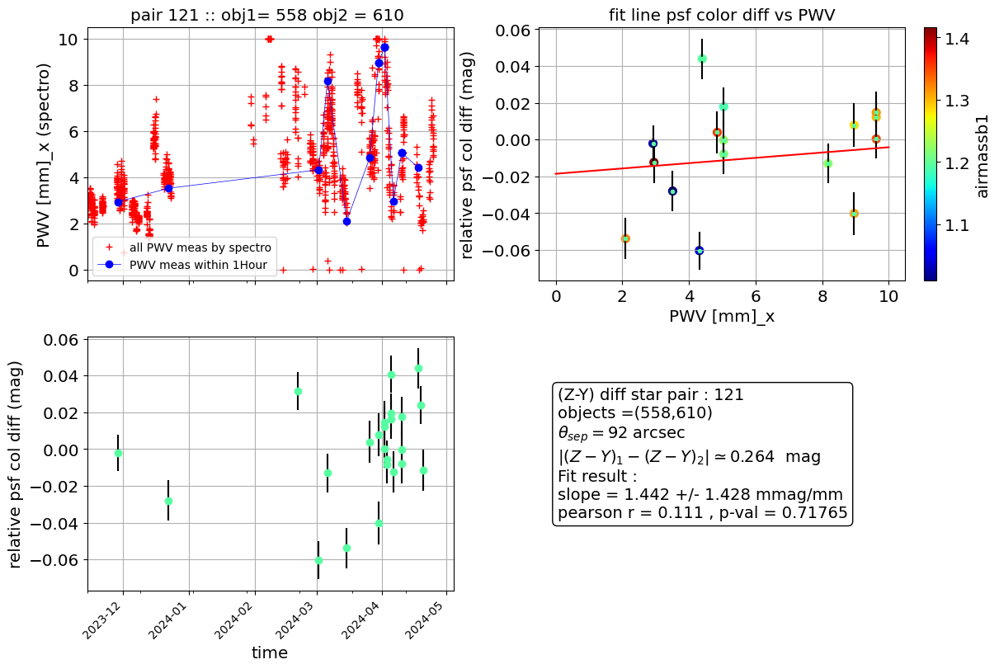

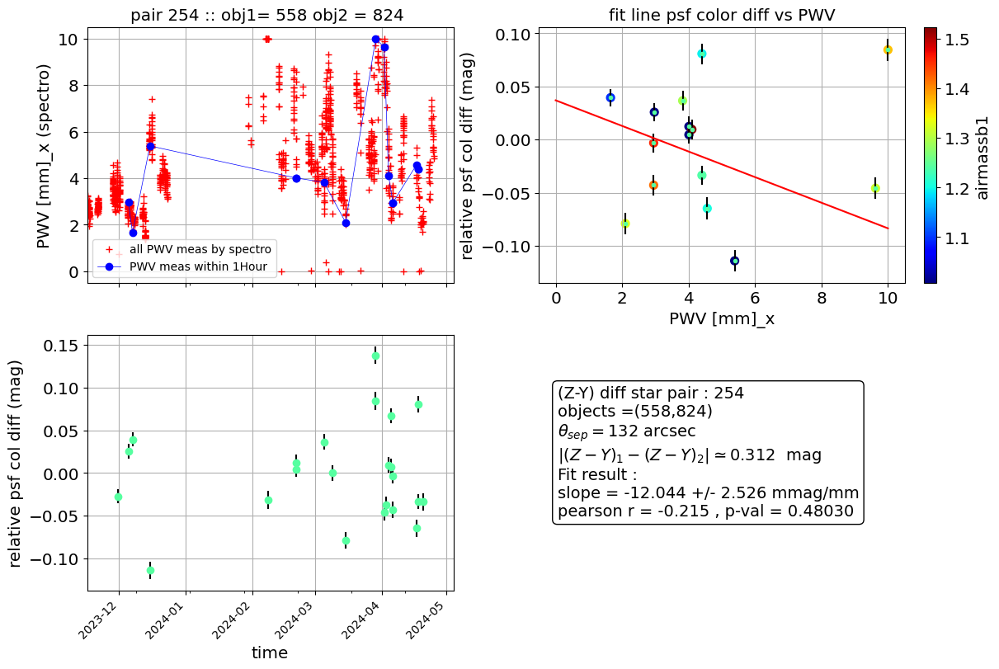

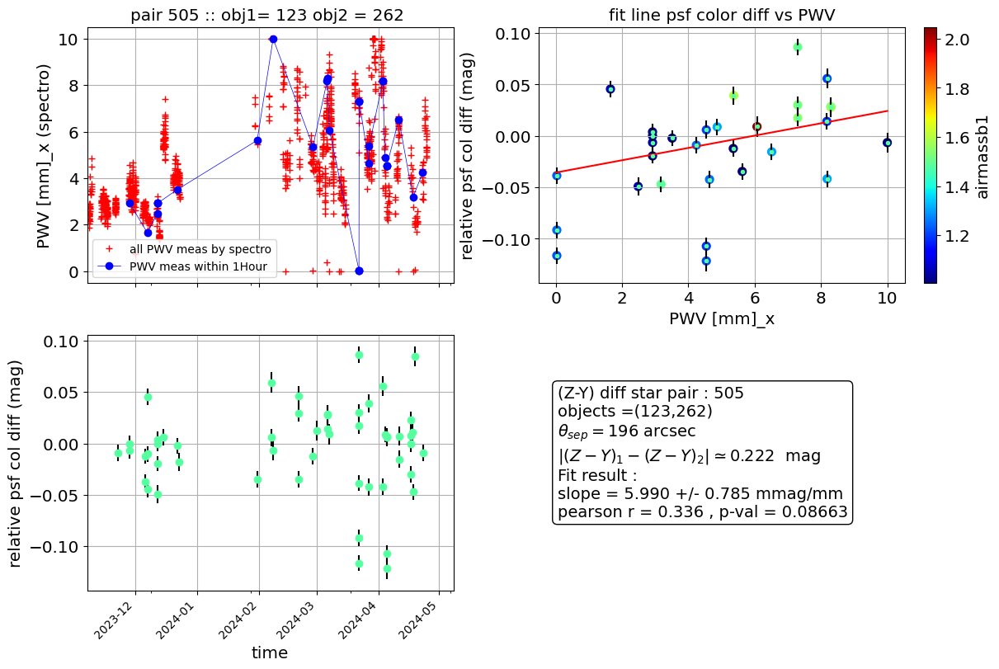

In [78]:
df_fit_psf = pd.DataFrame(columns=["idx_pair","idx_summary","color","slope","slope_err","sep"]) 

date_form = DateFormatter("%y-%m-%d")

count = 0
for good_idx in good_indexes:

    fig = plt.figure(figsize=(12,8),constrained_layout=True)
    gs = GridSpec(2, 2, wspace=0, hspace=0.01, height_ratios=[1,1],figure=fig)

    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[1,0],sharex=ax1)
    ax3 = fig.add_subplot(gs[0,1])
    ax4 = fig.add_subplot(gs[1,1])

    df_spec.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker='+',c="r",lw=0.0,grid=True,label="all PWV meas by spectro")


    # get the light curve
    df_col = all_colors_diff[good_idx]
    # Extract the row in df_summary with the pair number good_idx
    df_summary_row = df_summary[df_summary["idx_pair"].astype(int) == good_idx]

    # extract the corresponding index and refcol_ap_md column
    index_in_summary = df_summary_row.index[0]
    refcol_psf_md = df_summary_row["refcol_psf_md"].values[0]

    
    # compute a recentered colors fro plotting
    df_col["relpsfcol"] = df_col.psfcol12_s12-refcol_psf_md

    separation_angle = df_summary.loc[index_in_summary,"sep"]
  
    # compute the string
    textstr = '\n'.join((
    "(Z-Y) diff star pair :"
    r'objects =(%.0f,%.0f)' % (df_summary.loc[index_in_summary,"idx_obj1"],df_summary.loc[index_in_summary,"idx_obj2"],  ),
    r'$\theta_{sep} = %.0f$ arcsec' % (df_summary.loc[index_in_summary,"sep"], ),
    r'$|(Z-Y)_1- (Z-Y)_2| \simeq%.3f$  mag' % (df_summary.loc[index_in_summary,"refcol_psf_md"], )))

    title = "pair {} :: obj1= {} obj2 = {} ".format(good_idx,df_summary.loc[index_in_summary,"idx_obj1"].astype(int),
                                                    df_summary.loc[index_in_summary,"idx_obj2"].astype(int))
    ax1.set_title(title)
    ax1.set_ylabel("PWV [mm]_x (spectro)")
   
    
    ax2.errorbar(df_col.time1,df_col.psfcol12_s12-refcol_psf_md,yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt="o")
    df_col.plot(x="Time",y="PWV [mm]_x",ax=ax1,marker="o",c="b",lw=0.5,grid=True,label="PWV meas within 1Hour")
    #ax2.text(0.01, 0.97, textstr, transform=ax2.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    ax2.set_ylabel("relative psf col diff (mag)")
    ax2.set_xlabel("time")

    ax3.errorbar(df_col["PWV [mm]_x"],df_col.relpsfcol,xerr=df_col["PWV [mm]_err_x"],yerr=df_col.psfcol12Err_s12,color=the_color,ecolor="k",fmt=".")
    df_col.plot.scatter(x="PWV [mm]_x",y="relpsfcol",c="airmassb1",marker= "o",s=50,ax=ax3,colormap="jet")
    ax3.grid()
    ax3.set_ylabel("relative psf col diff (mag)")
    ax3.set_title("fit line psf color diff vs PWV")
    #ax4.errorbar(df_col["PWV [mm]_x"],df_col.relapcol,xerr=df_col["PWV [mm]_err_x"],yerr=df_col.apcol12Err_s12,color=the_color,ecolor="k",fmt="o")
    #ax4.grid()
    #ax4.set_xlabel("PWV [mm]_x (spectro)")
    ax4.set_axis_off()

    idx_tofit = (~np.isnan(df_col["PWV [mm]_x"])) & (df_col["PWV [mm]_x"] >=1) & (df_col["PWV [mm]_x"] <=9) 
  
    X = df_col["PWV [mm]_x"][idx_tofit]
    Y = df_col.relpsfcol[idx_tofit]
    EY = df_col.psfcol12Err_s12[idx_tofit]
    pearsonr = scipy.stats.pearsonr(X, Y) 
    spearmanr = scipy.stats.spearmanr(X, Y)
   
    output_fit =  curve_fit(func_line,X,Y,sigma=EY,p0= [0,0],absolute_sigma=True,method='lm',full_output=True)
    popt= output_fit[0]
    pcov = output_fit[1]
    perr = np.sqrt(np.diag(pcov))
    yfit = func_line(xfit,*popt)
    ax3.plot(xfit,yfit,'r-')
    textstr2 = '\n'.join((
    r'(Z-Y) diff star pair : %.0f' % (good_idx,),
    r'objects =(%.0f,%.0f)' % (df_summary.loc[index_in_summary,"idx_obj1"],df_summary.loc[index_in_summary,"idx_obj2"],  ),
    r'$\theta_{sep} = %.0f$ arcsec' % (df_summary.loc[index_in_summary,"sep"], ),
    r'$|(Z-Y)_1- (Z-Y)_2| \simeq%.3f$  mag' % (df_summary.loc[index_in_summary,"refcol_psf_md"], ),
    r"Fit result :",
    r'slope = %.3f +/- %.3f mmag/mm' % (1000*popt[0],1000*perr[0],),
    r'pearson r = %.3f , p-val = %.5f' % (pearsonr[0],pearsonr[1],),))
    #ax4.plot(xfit,yfit,'r-')
    ax4.text(0.05, 0.8, textstr2, transform=ax4.transAxes, fontsize=14,verticalalignment='top', bbox=props)

    df_fit_psf.loc[count] = [good_idx, index_in_summary, refcol_psf_md, popt[0]*1000, perr[0]*1000, separation_angle]  
    
    tmin = df_col["time1"].min()
    tmax = df_col["time1"].max()
    dt = tmax-tmin
    tmin = tmin-dt/10
    tmax = tmax+dt/10

    the_tmin=tmin
    the_tmax=tmax

    ax2.set_xlim(the_tmin,the_tmax)
    ax2.grid()
    #plt.xticks(rotation=45)
    ax2.set_xticks(ax2.get_xticks(), ax2.get_xticklabels(), rotation=45, ha='right',fontsize=10)
    plt.show()
    count += 1
    #if count > 2:
    #    break
   


Text(0, 0.5, '$d(\\Delta C)/d(PWV)$ (mmag/mm) ')

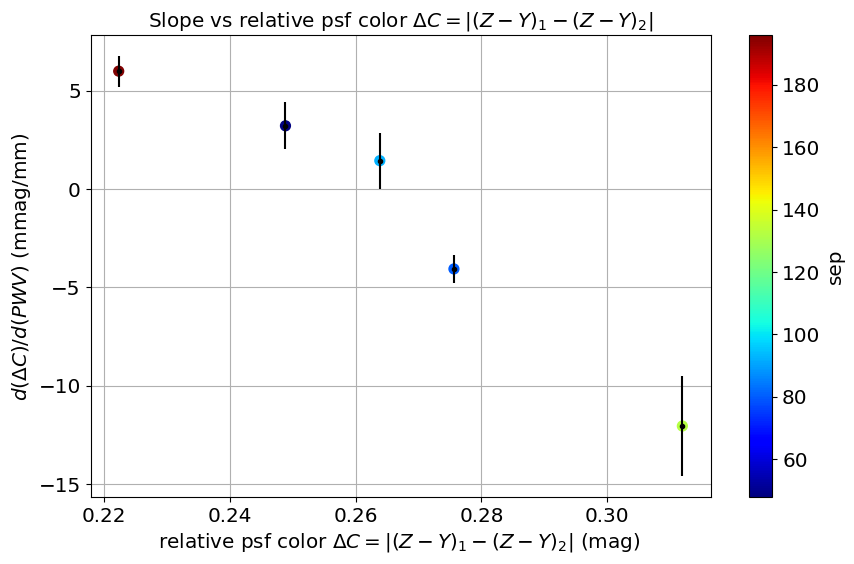

In [79]:
fig,ax  = plt.subplots(figsize=(10,6))
ax.errorbar(x=df_fit_psf["color"],y=df_fit_psf["slope"],yerr=df_fit_psf["slope_err"],ecolor="k",fmt=".",color="k") 
sc = df_fit_psf.plot.scatter(x="color",y="slope",c="sep",marker= "o",s=50,ax=ax,colormap="jet")
ax.grid()
#ax.set_ylim(-5.,10)
ax.set_title("Slope vs relative psf color $\Delta C = |(Z-Y)_1- (Z-Y)_2|$")
ax.set_xlabel("relative psf color $\Delta C = |(Z-Y)_1- (Z-Y)_2|$ (mag) ")
ax.set_ylabel("$d(\Delta C)/d(PWV)$ (mmag/mm) ")
#cbar = plt.colorbar(sc)
#cbar.ax.set_xlabel('separation angle (arcsec)', rotation=0)